# Final Project IronHack - Prediction of New cases od COVID-19 worldwide (an early vaccination evaluation)

# 1) Setting up the process

## 1.1) Importing all necessary packages

In [6]:
pip install plotly

In [7]:
pip install --upgrade --no-deps statsmodels

     |████████████████████████████████| 9.5MB 7.1MB/s 
  Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [8]:
!pip install pmdarima

     |████████████████████████████████| 1.5MB 8.0MB/s 
     |████████████████████████████████| 2.1MB 34.1MB/s 
  Found existing installation: Cython 0.29.22
    Uninstalling Cython-0.29.22:
      Successfully uninstalled Cython-0.29.22


In [9]:
pip install pyforest

  Created wheel for pyforest: filename=pyforest-1.0.3-py2.py3-none-any.whl size=13716 sha256=609ad84dec80897be90c48ab82673db18ce71fa6417c18e4f66d18a17a992e67
  Stored in directory: /root/.cache/pip/wheels/af/0b/39/340a7f15fc8d4ff5ab50847b28789afea04452a9d51b9721b5
Successfully built pyforest


In [10]:
import pyforest
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as ss
from scipy.stats import probplot
import warnings
warnings.filterwarnings('ignore')
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import Normalizer
import statsmodels.api as sm
from pandas.plotting import lag_plot
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.stattools import adfuller
from pmdarima.arima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.eval_measures import rmse

%matplotlib inline

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 300)

In [11]:
# Code to read csv file into Colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [12]:
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [13]:
link1 = 'https://drive.google.com/file/d/1qvJa82GROgg03fWs81U4Psg3j2QKEnae/view?usp=sharing' #main
link2 = 'https://drive.google.com/file/d/1ho9WnHNZtzK8LdWFOOCNu0ZjDb0AgoPA/view?usp=sharing' #face covering
link3 = 'https://drive.google.com/file/d/1EYEv78xj9SysoXU60jwTfqtZN_SIIdfI/view?usp=sharing' #public events
link4 = 'https://drive.google.com/file/d/1WjG5QP_7GEyA0eK_uKo2lPpLubFxGni1/view?usp=sharing' #public transport
link5 = 'https://drive.google.com/file/d/1jPGxNpYTCF2LEUjVCmrSS8_O1vj_dBn_/view?usp=sharing' #stay at home
link6 = 'https://drive.google.com/file/d/1SNGZkwMxKSJON69bmaxAI9HJWV30cRGG/view?usp=sharing' #schools and workplaces
link7 = 'https://drive.google.com/file/d/1PbSmOwbPJ1OLCzfnCNu50Jvm4E0oFpHB/view?usp=sharing' #stringency index
link8 = 'https://drive.google.com/file/d/1kI67OC5WeC3TVmxkdrIslqg9PwgHc24q/view?usp=sharing' #google mobility data
link9 = 'https://drive.google.com/file/d/1TBkDYOHR9cICHNMFKxIdqPvTpsH3BoG5/view?usp=sharing' #weather data

id1 = '1qvJa82GROgg03fWs81U4Psg3j2QKEnae'
id2 = '1ho9WnHNZtzK8LdWFOOCNu0ZjDb0AgoPA'
id3 = '1EYEv78xj9SysoXU60jwTfqtZN_SIIdfI'
id4 = '1WjG5QP_7GEyA0eK_uKo2lPpLubFxGni1'
id5 = '1jPGxNpYTCF2LEUjVCmrSS8_O1vj_dBn_'
id6 = '1SNGZkwMxKSJON69bmaxAI9HJWV30cRGG'
id7 = '1PbSmOwbPJ1OLCzfnCNu50Jvm4E0oFpHB'
id8 = '1kI67OC5WeC3TVmxkdrIslqg9PwgHc24q'
id9 = '1TBkDYOHR9cICHNMFKxIdqPvTpsH3BoG5'

#reading data into colab with permission from google drive
downloaded = drive.CreateFile({'id':id1}) 
downloaded.GetContentFile('owid-covid-data.csv')  
main = pd.read_csv('owid-covid-data.csv')

downloaded = drive.CreateFile({'id':id2}) 
downloaded.GetContentFile('face-covering-policies-covid.csv')  
masks = pd.read_csv('face-covering-policies-covid.csv')

downloaded = drive.CreateFile({'id':id3}) 
downloaded.GetContentFile('public-events-covid.csv')  
events = pd.read_csv('public-events-covid.csv')

downloaded = drive.CreateFile({'id':id4}) 
downloaded.GetContentFile('public-transport-covid.csv')  
transp = pd.read_csv('public-transport-covid.csv')

downloaded = drive.CreateFile({'id':id5}) 
downloaded.GetContentFile('stay-at-home-covid.csv')  
home = pd.read_csv('stay-at-home-covid.csv')

downloaded = drive.CreateFile({'id':id6}) 
downloaded.GetContentFile('school-closures-covid.csv')  
duty = pd.read_csv('school-closures-covid.csv')

downloaded = drive.CreateFile({'id':id7}) 
downloaded.GetContentFile('covid-stringency-index.csv')  
stringency = pd.read_csv('covid-stringency-index.csv')

downloaded = drive.CreateFile({'id':id8}) 
downloaded.GetContentFile('google_mobility_changes-visitors-covid.csv')  
googlemob = pd.read_csv('google_mobility_changes-visitors-covid.csv')

downloaded = drive.CreateFile({'id':id9})
downloaded.GetContentFile('temp.csv')
weather=pd.read_csv('temp.csv',delimiter=';')

In [14]:
#checking heads to assess quality
main.head(2)
masks.head(2)
events.head(2)
transp.head(2)
home.head(2)
duty.head(2)
stringency.head(2)
googlemob.head(2)
weather.head(2)

,CONTINENT,COUNTRY,DATE,TEMP,HUMIDITY,WIND
0,Americas,Aruba,2020-01-02,27.0,69.9,23.0
1,Americas,Aruba,2020-01-03,27.0,72.4,21.0


## 1.2) Improving quality of weather data and cleaning
* empty null values with the mean of previous and next 
* uniform them 

In [15]:
#filling the three numerical columns NaNs with the mean of previous and next value (if empty go to first non empty for the mean)
#then doing the same for Humidity and Wind columns
weather['TEMP']=(weather['TEMP'].ffill() + weather['TEMP'].bfill())/2
weather['TEMP']= weather['TEMP'].ffill().bfill()
weather['TEMP'].isna().sum()

weather['HUMIDITY']=(weather['HUMIDITY'].ffill() + weather['HUMIDITY'].bfill())/2
weather['HUMIDITY']= weather['HUMIDITY'].ffill().bfill()
weather['HUMIDITY'].isna().sum()

weather['WIND']=(weather['WIND'].ffill() + weather['WIND'].bfill())/2
weather['WIND']= weather['WIND'].ffill().bfill()
weather['WIND'].isna().sum()

#stacking two weather df upon each other for doubling the temp,hum,wind for 2021 (couldn't find better data/way)
weather2=weather.copy()
weather2['DATE']=weather2['DATE'].replace('2020','2021',regex=True)
weatcomp=pd.concat([weather,weather2])
weatcomp=weatcomp.reset_index()

In [16]:
masks = masks.drop(columns=['Code'])
events = events.drop(columns=['Code'])
transp = transp.drop(columns=['Code'])
home = home.drop(columns=['Code'])
duty = duty.drop(columns=['Code'])
stringency = stringency.drop(columns=['Code'])
googlemob = googlemob.drop(columns=['Code'])

## 1.3) Unifying all the dataframes into one 
(left joins for not dropping values)

In [17]:
# merging first all the small dfs together and then pulling it on the main df
unified = pd.merge(home, transp,  how='left', left_on=['Entity','Date'], right_on = ['Entity','Date'])
unified = pd.merge(unified, events,  how='left', left_on=['Entity','Date'], right_on = ['Entity','Date'])
unified = pd.merge(unified, masks,  how='left', left_on=['Entity','Date'], right_on = ['Entity','Date'])
data = pd.merge(main, unified,  how='left', left_on=['location','date'], right_on = ['Entity','Date'])
data = pd.merge(data, duty,  how='left', left_on=['location','date'], right_on = ['Entity','Date'])
data = pd.merge(data, stringency,  how='left', left_on=['location','date'], right_on = ['Entity','Date'])
data = pd.merge(data, googlemob,  how='left', left_on=['location','date'], right_on = ['Entity','Date'])
data = pd.merge(data, weatcomp,  how='left', left_on=['location','date'], right_on = ['COUNTRY','DATE'])

### 1.3.1) Main df created, assessing quality

In [18]:
data =data.drop(columns=['COUNTRY','DATE','CONTINENT'])
data.head(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index_x,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,Entity_x,Date_x,stay_home_requirements,close_public_transport,cancel_public_events,facial_coverings,Entity_y,Date_y,school_closures,Entity_x,Date_x,stringency_index_y,Entity_y,Date_y,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential,index,TEMP,HUMIDITY,WIND
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,0.026,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,Afghanistan,2020-02-24,0.0,0.0,0.0,0.0,Afghanistan,2020-02-24,0.0,Afghanistan,2020-02-24,8.33,Afghanistan,2020-02-24,1.000,6.286,2.714,6.143,6.000,0.286,430.0,10.0,44.6,80.0
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,Afghanistan,2020-02-25,0.0,0.0,0.0,0.0,Afghanistan,2020-02-25,0.0,Afghanistan,2020-02-25,8.33,Afghanistan,2020-02-25,0.857,6.286,2.429,6.143,6.143,0.429,431.0,12.0,39.4,53.0
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,Afghanistan,2020-02-26,0.0,0.0,0.0,0.0,Afghanistan,2020-02-26,0.0,Afghanistan,2020-02-26,8.33,Afghanistan,2020-02-26,0.857,6.571,2.571,6.571,6.143,0.429,432.0,10.0,43.3,15.0
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,Afghanistan,2020-02-27,0.0,0.0,0.0,0.0,Afghanistan,2020-02-27,0.0,Afghanistan,2020-02-27,8.33,Afghanistan,2020-02-27,1.000,6.143,2.857,6.429,6.286,0.571,433.0,72.0,61.3,12.0
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,Afghanistan,2020-02-28,0.0,0.0,0.0,0.0,Afghanistan,2020-02-28,0.0,Afghanistan,2020-02-28,8.33,Afghanistan,2020-02-28,0.714,5.571,2.429,6.000,6.143,0.857,434.0,68.0,80.1,90.0


In [19]:
#check for all the nans
nulls_percent_df=(data.isna().sum()).reset_index()
nulls_percent_df.columns = ['column_name', 'nulls_count']
nulls_percent_df

,column_name,nulls_count
0,iso_code,0
1,continent,3571
2,location,0
3,date,0
4,total_cases,972
5,new_cases,974
6,new_cases_smoothed,1976
7,total_deaths,10147
8,new_deaths,9989
9,new_deaths_smoothed,1976


### 1.3.2) Checking for percentage of Nans in each column
ideally one could drop columns with high percentage of null values

In [20]:
# % of missing values per column
for col in data.columns:
    pct_missing = np.mean(data[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

iso_code - 0%
continent - 5%
location - 0%
date - 0%
total_cases - 1%
new_cases - 1%
new_cases_smoothed - 3%
total_deaths - 14%
new_deaths - 14%
new_deaths_smoothed - 3%
total_cases_per_million - 2%
new_cases_per_million - 2%
new_cases_smoothed_per_million - 3%
total_deaths_per_million - 14%
new_deaths_per_million - 14%
new_deaths_smoothed_per_million - 3%
reproduction_rate - 19%
icu_patients - 89%
icu_patients_per_million - 89%
hosp_patients - 87%
hosp_patients_per_million - 87%
weekly_icu_admissions - 99%
weekly_icu_admissions_per_million - 99%
weekly_hosp_admissions - 98%
weekly_hosp_admissions_per_million - 98%
new_tests - 54%
total_tests - 55%
total_tests_per_thousand - 55%
new_tests_per_thousand - 54%
new_tests_smoothed - 48%
new_tests_smoothed_per_thousand - 48%
positive_rate - 50%
tests_per_case - 51%
tests_units - 46%
total_vaccinations - 96%
people_vaccinated - 97%
people_fully_vaccinated - 98%
new_vaccinations - 97%
new_vaccinations_smoothed - 94%
total_vaccinations_per_hund

In [21]:
drop_list=['reproduction_rate','icu_patients','icu_patients_per_million','hosp_patients',
           'hosp_patients_per_million','weekly_icu_admissions','weekly_icu_admissions_per_million',
           'weekly_hosp_admissions','weekly_hosp_admissions_per_million','Entity_x','Date_x','Entity_y','Date_y']

data = data.drop(columns=drop_list)

There are a lot of columns with high number of NaNs, I am not dropping them yet because I think replacing them with 0 might still give valuable insights. (how to deal with high stack on 0?)

Next I will replace all NaNs with 0. I don't go for the .value_counts() explore-and-then-decide approach because I understand that NaNs appear only where it's too early in the progression to have data (i.e. a certain country hasn't start collecting info about that factor just yet).
I am working on a well curated dataset! (daily updates)

In [22]:
#replacing all the NaNs with 0. Explore now distplot and maybe drop more columns based on the high stack on 0 this time
data=data.fillna(0)

#check that there is no more Nans
for col in data.columns:
    pct_missing = np.mean(data[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

iso_code - 0%
continent - 0%
location - 0%
date - 0%
total_cases - 0%
new_cases - 0%
new_cases_smoothed - 0%
total_deaths - 0%
new_deaths - 0%
new_deaths_smoothed - 0%
total_cases_per_million - 0%
new_cases_per_million - 0%
new_cases_smoothed_per_million - 0%
total_deaths_per_million - 0%
new_deaths_per_million - 0%
new_deaths_smoothed_per_million - 0%
new_tests - 0%
total_tests - 0%
total_tests_per_thousand - 0%
new_tests_per_thousand - 0%
new_tests_smoothed - 0%
new_tests_smoothed_per_thousand - 0%
positive_rate - 0%
tests_per_case - 0%
tests_units - 0%
total_vaccinations - 0%
people_vaccinated - 0%
people_fully_vaccinated - 0%
new_vaccinations - 0%
new_vaccinations_smoothed - 0%
total_vaccinations_per_hundred - 0%
people_vaccinated_per_hundred - 0%
people_fully_vaccinated_per_hundred - 0%
new_vaccinations_smoothed_per_million - 0%
stringency_index_x - 0%
population - 0%
population_density - 0%
median_age - 0%
aged_65_older - 0%
aged_70_older - 0%
gdp_per_capita - 0%
extreme_poverty 

In [23]:
for i in data['location'].unique():
  print(i)

Afghanistan
Africa
Albania
Algeria
Andorra
Angola
Anguilla
Antigua and Barbuda
Argentina
Armenia
Asia
Australia
Austria
Azerbaijan
Bahamas
Bahrain
Bangladesh
Barbados
Belarus
Belgium
Belize
Benin
Bermuda
Bhutan
Bolivia
Bosnia and Herzegovina
Botswana
Brazil
Brunei
Bulgaria
Burkina Faso
Burundi
Cambodia
Cameroon
Canada
Cape Verde
Cayman Islands
Central African Republic
Chad
Chile
China
Colombia
Comoros
Congo
Costa Rica
Cote d'Ivoire
Croatia
Cuba
Cyprus
Czechia
Democratic Republic of Congo
Denmark
Djibouti
Dominica
Dominican Republic
Ecuador
Egypt
El Salvador
Equatorial Guinea
Eritrea
Estonia
Eswatini
Ethiopia
Europe
European Union
Faeroe Islands
Falkland Islands
Fiji
Finland
France
Gabon
Gambia
Georgia
Germany
Ghana
Gibraltar
Greece
Greenland
Grenada
Guatemala
Guernsey
Guinea
Guinea-Bissau
Guyana
Haiti
Honduras
Hong Kong
Hungary
Iceland
India
Indonesia
International
Iran
Iraq
Ireland
Isle of Man
Israel
Italy
Jamaica
Japan
Jersey
Jordan
Kazakhstan
Kenya
Kosovo
Kuwait
Kyrgyzstan
Laos
Latv

## 1.4) Defining a Dictionary where each key is a df of each country
 Access this by dict['country']. This will come in handy later one when parsing my functions on all the countries in an automated fashion

In [24]:
countries={}
for i in data['location'].unique():
  countries[i]=data[data['location']==i]

In [25]:
countries['Italy'].to_csv('italy.csv')

In [26]:
countries['Italy'].head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index_x,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,stay_home_requirements,close_public_transport,cancel_public_events,facial_coverings,school_closures,stringency_index_y,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential,index,TEMP,HUMIDITY,WIND
32909,ITA,Europe,Italy,2020-01-31,2.0,2.0,0.0,0.0,0.0,0.0,0.033,0.033,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.44,60461828.0,205.859,47.9,23.021,16.24,35220.084,2.0,113.151,4.78,19.8,27.8,0.0,3.18,83.51,0.892,0.0,0.0,0.0,0.0,0.0,19.44,0.0,0.0,0.0,0.0,0.0,0.0,59914.0,12.0,76.3,56.0
32910,ITA,Europe,Italy,2020-02-01,2.0,0.0,0.0,0.0,0.0,0.0,0.033,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.44,60461828.0,205.859,47.9,23.021,16.24,35220.084,2.0,113.151,4.78,19.8,27.8,0.0,3.18,83.51,0.892,0.0,0.0,0.0,0.0,0.0,19.44,0.0,0.0,0.0,0.0,0.0,0.0,59915.0,13.0,86.5,74.0
32911,ITA,Europe,Italy,2020-02-02,2.0,0.0,0.0,0.0,0.0,0.0,0.033,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.44,60461828.0,205.859,47.9,23.021,16.24,35220.084,2.0,113.151,4.78,19.8,27.8,0.0,3.18,83.51,0.892,0.0,0.0,0.0,0.0,0.0,19.44,0.0,0.0,0.0,0.0,0.0,0.0,59916.0,12.0,81.4,65.0
32912,ITA,Europe,Italy,2020-02-03,2.0,0.0,0.0,0.0,0.0,0.0,0.033,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.44,60461828.0,205.859,47.9,23.021,16.24,35220.084,2.0,113.151,4.78,19.8,27.8,0.0,3.18,83.51,0.892,0.0,0.0,0.0,0.0,0.0,19.44,0.0,0.0,0.0,0.0,0.0,0.0,59917.0,11.0,81.5,15.0
32913,ITA,Europe,Italy,2020-02-04,2.0,0.0,0.0,0.0,0.0,0.0,0.033,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.44,60461828.0,205.859,47.9,23.021,16.24,35220.084,2.0,113.151,4.78,19.8,27.8,0.0,3.18,83.51,0.892,0.0,0.0,0.0,0.0,0.0,19.44,0.0,0.0,0.0,0.0,0.0,0.0,59918.0,78.0,76.9,26.0


In [27]:
# isolating countries I am interested in to run my functions over

#this method is time consuming but I operated it in order to run first prototypes on copuntries of my interest

italy=data[data['location']=='Italy']
israel=data[data['location']=='Israel']
germany=data[data['location']=='Germany']
brazil=data[data['location']=='Brazil']
united_states=data[data['location']=='United States']

#making a list so I can iterate
sample=[italy, israel, germany, brazil, united_states]

# 2) EDA (Exploratory Data Analysis)

## In the EDA insights are looked for by investigating on the relations between my features. Special attention is paid to relations between my features X and my target Y (new_cases).

In [28]:
# Exploring the Temperature trend in Italy

# sns.lineplot(x=data[data['location']=='Italy']['date'],y=data[data['location']=='Italy']['TEMP'])
# plt.show()

### Lets check the target trend in some countries
In a dataset where all features are progressive over time, if I want to visualize the trend I always have to plot against the time dimension. (Unlike other cases in which one can just make a distplot of a certain feature and check the distribution)

In [29]:
# check a country of your interest here (first letter capitalized!)

# country=data[data['location']==input()]
# sns.lineplot(x=country['date'], y=country['total_deaths'])
# plt.show()

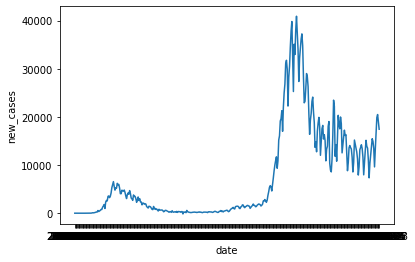

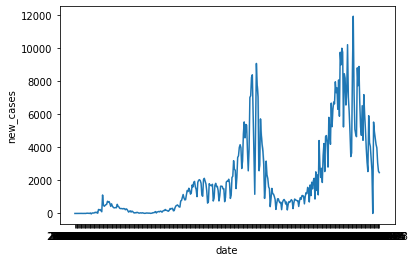

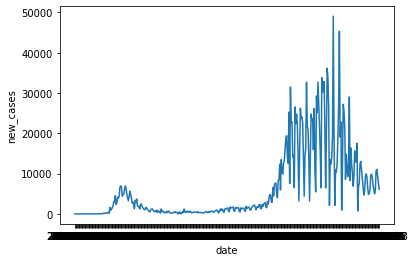

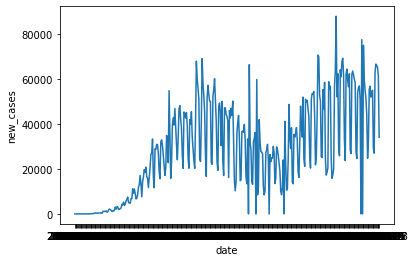

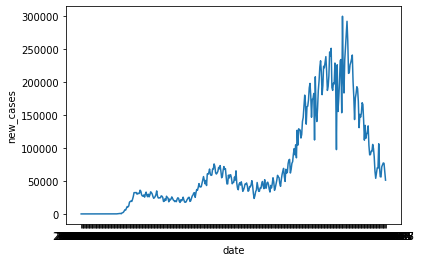

In [30]:
# fig,axs = plt.subplots(ncols=5, nrows=1, figsize =(30, 10))
# plt.subplots_adjust(right=1.5)
# plt.subplot(1,5,i) #in the loop
# plt.xlabel('{}'.format(i['location']), size=15)
# plt.ylabel('new_cases', size=15, labelpad=12.5)

for i in sample:
    sns.lineplot(x=i['date'], y=i['new_cases'])
    plt.show()

#below applies to the whole df
# for i in data['location'].unique():
#     sns.lineplot(x=data[data['location']==i]['date'], y=data[data['location']==i]['new_cases'])
#     plt.show()

In [31]:
# for i in sample:
#     sns.lineplot(x=i['date'], y=i['total_deaths'])

## 2.1) Let's check how the Y variable looks like 

data New_cases Mean: 4968.294628515423
data New_cases Median: 55.0
data New_cases Max: 879905.0
data New_cases Skew: 13.28269797739037


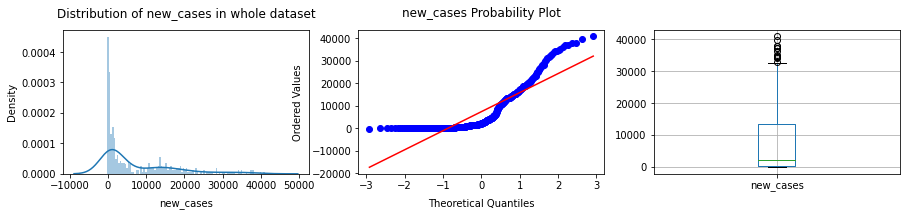

In [32]:
print('data New_cases Mean: {}'.format(data['new_cases'].mean()))
print('data New_cases Median: {}'.format(data['new_cases'].median()))
print('data New_cases Max: {}'.format(data['new_cases'].max()))
print('data New_cases Skew: {}'.format(data['new_cases'].skew()))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,2))
plt.subplots_adjust(left=None, bottom=5, right=None, top=6, wspace=None, hspace=None)

sns.distplot(italy['new_cases'], hist=True, bins = 100, ax=ax1)
probplot(italy['new_cases'], plot=ax2)
italy.boxplot('new_cases', ax=ax3)

ax1.set_xlabel('new_cases', size=10, labelpad=8)
ax2.set_xlabel('Theoretical Quantiles', size=10, labelpad=8)
ax2.set_ylabel('Ordered Values', size=10, labelpad=8)

ax1.set_title('Distribution of new_cases in whole dataset', size=12, y=1.05)
ax2.set_title('new_cases Probability Plot', size=12, y=1.05)

plt.show()

**observation**:
target is highly right skewed due to slow progression of number of infection during early stages. I will consider if it should be transformed with a log or boxcox function to normalize it and therefore allowing the model to fit it better

## 2.2) Lets check how variables are correlated with one another

Running this on Israel, which as of now has the highest percentage of vaccinated people so I can see the effect of the vaccination better

In [33]:
#excluding the categoricals features in order to see correlation between numericals
israelnum=israel.select_dtypes(np.number)

This is a correlation Matrix - or Heatmap. It present a score for each combination of features called correlation coefficient. It is determined by dividing the covariance by the product of the two variables' standard deviations. Standard deviation is a measure of the dispersion of data from its average.

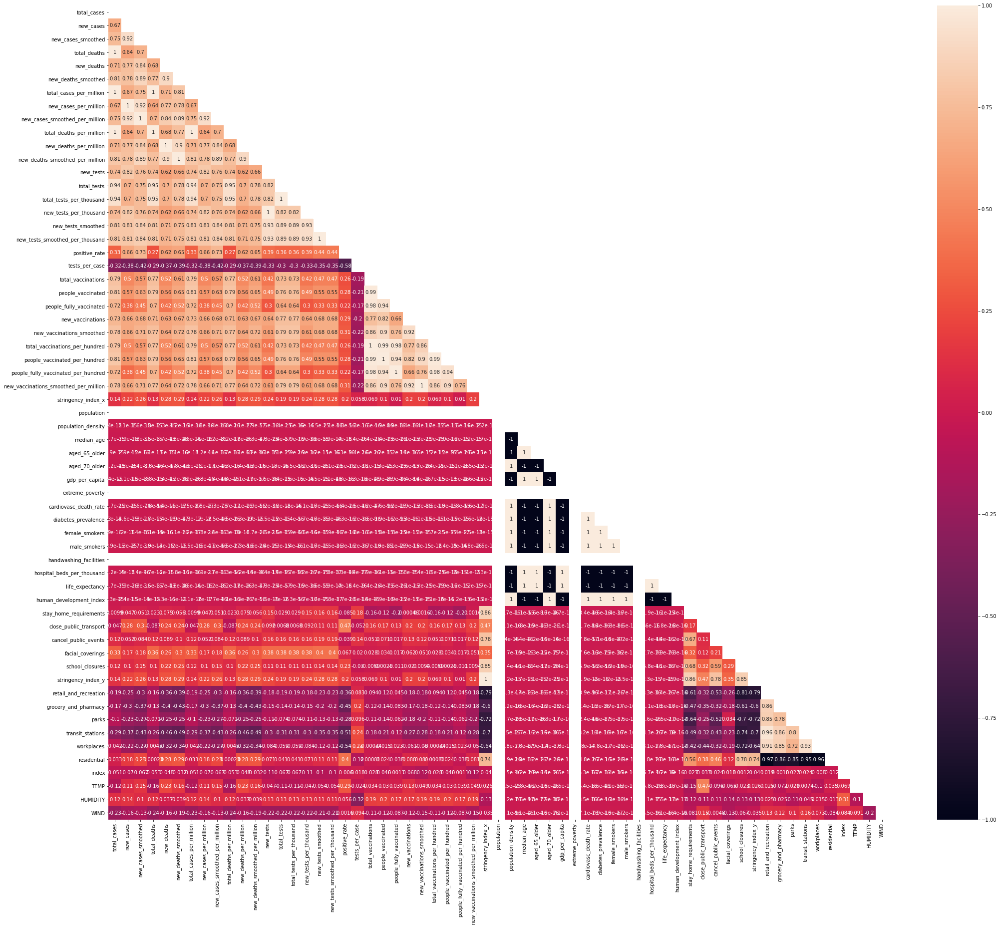

In [34]:
correlations_matrix= israelnum.corr()
mask = np.zeros_like(correlations_matrix)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(35, 30))
ax = sns.heatmap(correlations_matrix, mask=mask, annot=True)
plt.show()

There are two things to keep our eyes on when evaluating an heatmap:
* 1) **we want to keep features that show high correlation with out target Y**
* 2) **we want to drop features that show high correlation within themselves (Xs)**

1) New cases is (quite) highly correlated with two areas. The first one involves all features that indirectly contain the Y itself somehow, such as new_cases_smoothed, or all the ones involving total deaths, total tests. These are all obviously dependant on the increase in number of new cases. So although they show high correlation with target we will drop them, because using them for prediction would be like cheating and just nonsense overall.
The second highly correlated are is the one containing vaccination features.

2) We have a few areas in which we can observe hihg correlation among Xs. Ideally we want to drop these because using very closely related variable would bias the model in identifying them as better predictors and the model would lean on that direction. Instead we want something impartial and balanced.

I have to drop (maybe temporarely) the feature referring to the tests (it goes up as the new cases go up of course but it does cause them to go up) and all its related ones.

## 2.3) Checking the effect of constant variables:
* There are some variables that are **constant for each country**, so in order to see the effect one must compare among countries. 
* I should plot those against **the mean** of new (or the max of total) cases for all the countries as see the affect.
* These features are population, handwashing facilities, extreme poverty, median age, aged_65_older,	aged_70_older,	gdp_per_capita,	cardiovasc_death_rate,	diabetes_prevalence,	female_smokers,	male_smokers,	handwashing_facilities,	hospital_beds_per_thousand, life_expectancy. 

In [35]:
#making a list of constant features
constants=['population', 'handwashing_facilities', 'extreme_poverty', 'median_age', 'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers', 'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand', 'life_expectancy']
#removing continents from our df to see effect of contants on new cases
## infact continents would unbalance the scale of the axes making it more difficult to see trends
continent=['Africa','Asia','Oceania','Europe','European Union', 'World']
data_countries=data[~data['location'].isin(continent)]

see how constant variables relate to new cases

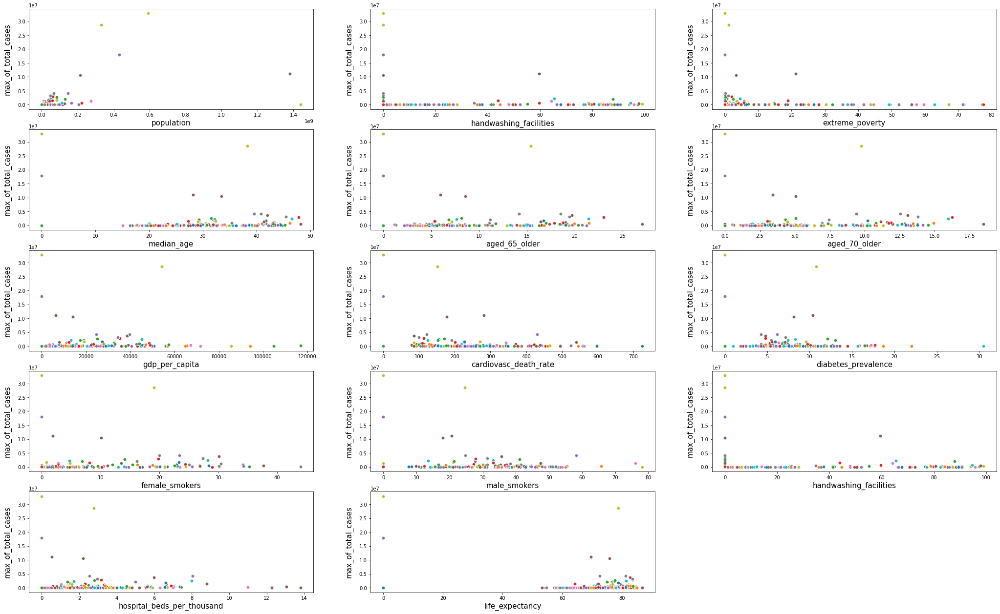

In [36]:
fig,axs = plt.subplots(ncols=3, nrows=3, figsize =(20, 22))
plt.subplots_adjust(right=1.5)

for j,feature in enumerate(constants,1):
  for i in data_countries['location'].unique():
    plt.subplot(5, 3, j)
    sns.scatterplot(x=data_countries[data_countries['location']==i][feature], 
                    y=data_countries[data_countries['location']==i]['total_cases'].max()
                    # y=data_countries[data_countries['location']==i]['new_cases'].mean() #alternative y axis 
                    # y=data_countries[data_countries['location']==i]['total_deaths'].max() #alternative y axis
                    # ,label=f"country: {i}"
                    )
    #plt.legend()
    plt.xlabel('{}'.format(feature), size=15)
    plt.ylabel('max_of_total_cases', size=15, labelpad=12.5)
    # plt.ylabel('avg_of_new_cases', size=15, labelpad=12.5)
    # plt.ylabel('max_of_total_deaths', size=15, labelpad=12.5)
    # plt.title("{} VS Total Cases".format(feature))

see how constant variables relate to total deaths is also interesting

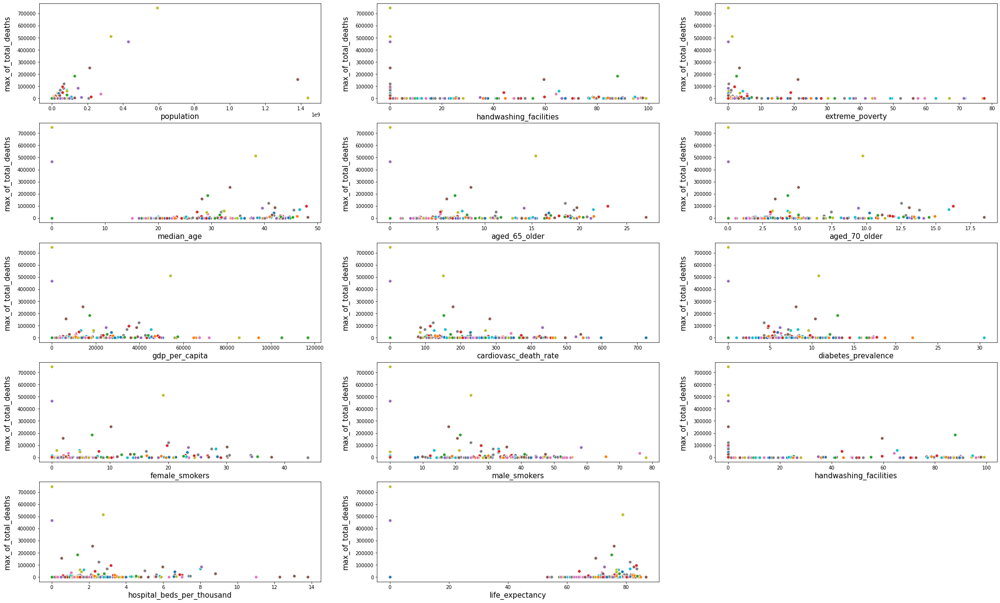

In [37]:
fig,axs = plt.subplots(ncols=3, nrows=3, figsize =(20, 22))
plt.subplots_adjust(right=1.5)

for j,feature in enumerate(constants,1):
  for i in data_countries['location'].unique():
    plt.subplot(5, 3, j)
    sns.scatterplot(x=data_countries[data_countries['location']==i][feature], 
                    # y=data_countries[data_countries['location']==i]['total_cases'].max()
                    # y=data_countries[data_countries['location']==i]['new_cases'].mean() #alternative y axis 
                    y=data_countries[data_countries['location']==i]['total_deaths'].max() #alternative y axis
                    # ,label=f"country: {i}"
                    )
    #plt.legend()
    plt.xlabel('{}'.format(feature), size=15)
    # plt.ylabel('max_of_total_cases', size=15, labelpad=12.5)
    # plt.ylabel('avg_of_new_cases', size=15, labelpad=12.5)
    plt.ylabel('max_of_total_deaths', size=15, labelpad=12.5)
    # plt.title("{} VS Total Cases".format(feature))

**observations**: 
* increse population has higher number of new cases
* only when handwashing facilities are really scarse we see increase in cases
* extreme por countries have less infections (more likely reflecting to difference in weather and population than actual GDP)
* higher median age and generally more elderly shows higher cases
* percentage of smokers dont influence
* scarcity of beds in hospitals lead to more deaths
* life expectancy - the higher the more cases rise

## 2.4) Check if there is linear direct correlation among the Xs
or more generally identify particular trends that can indicate dependancy

In [38]:
israelnum= israel.select_dtypes(include=np.number)

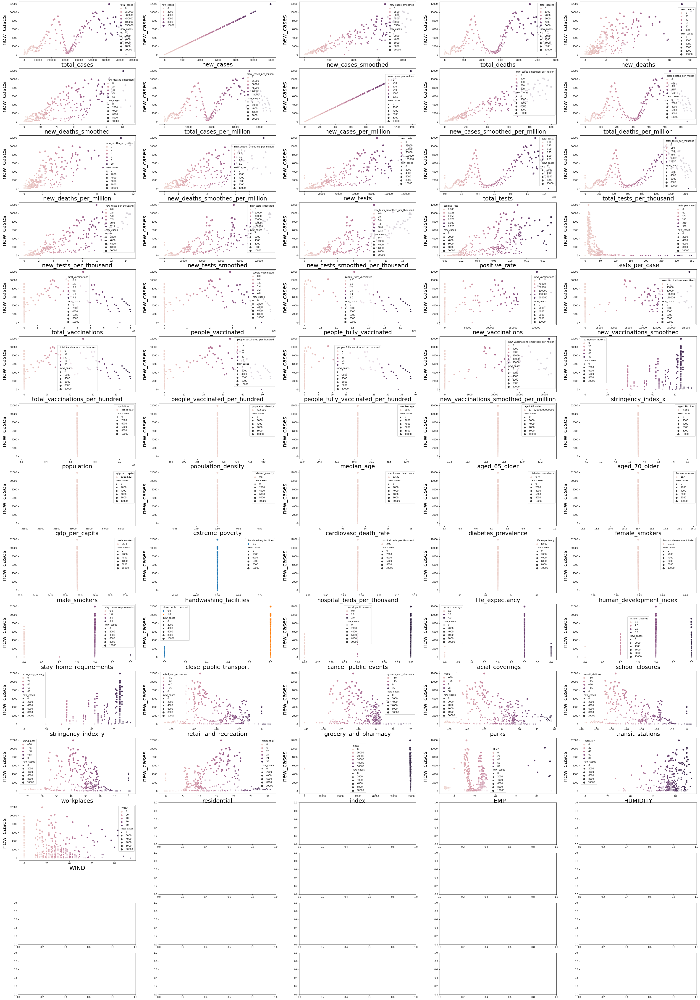

In [39]:
fig,axs = plt.subplots(ncols=5, nrows=20, figsize =(30, 80))
plt.subplots_adjust(right=1.5)
 
for i, feature in enumerate(list(israelnum.columns), 1):    
    plt.subplot(len(israelnum.columns)/4,5, i) #change the first argument according to how many variables are left (num of rows - initial 12)
    sns.scatterplot(x=feature, y='new_cases', hue='{}'.format(feature), cmap = 'OrRd', size='new_cases', data=israelnum)
    plt.xlabel('{}'.format(feature), size=25)
    plt.ylabel('new_cases', size=25, labelpad=12.5)
plt.show()

**observations**:
*TEMPERATURE: most infections group into two ranges of temperature which is very interesting
*HUMIDITY: the higher the more infections rise -also very interesting (particles travel easier through air?)
*WIND: the higher (km/h) and the lower infections are (somehow intuitive but still insightful)

*google mobility trend data show movement of people in certain areas and how it directly relates to infections
*STRINGENCY: only when reaching full lockdown cases went down - prior to that they kept rising adn therefore stringency of measures adopted increased 

*VACCINATION: as people started get vaccinated (moving on the X axis) n. of cases kept reducing more and more (important)

In [40]:
to_drop=['new_cases_per_million','new_cases_smoothed','new_cases_smoothed_per_million',
         'new_tests_smoothed','new_tests_smoothed_per_thousand','new_tests_per_thousand','new_tests',
         'total_tests_per_thousand','total_tests','new_deaths','new_deaths_per_million','total_cases',
         'total_cases_per_million','new_deaths_smoothed_per_million','new_deaths_smoothed','positive_rate',
         'total_deaths','total_deaths_per_million','stringency_index_y'
         ,'tests_per_case'
         ]

In [41]:
to_drop2=['new_cases_per_million','new_cases_smoothed','new_cases_smoothed_per_million',
         'new_tests_smoothed','new_tests_smoothed_per_thousand','new_tests_per_thousand','new_tests',
         'total_tests_per_thousand','total_tests','new_deaths','new_deaths_per_million','new_cases',
         'total_cases_per_million','new_deaths_smoothed_per_million','new_deaths_smoothed','positive_rate',
         'total_deaths','total_deaths_per_million','stringency_index_y'
          ,'tests_per_case'
          ]

In [42]:
# if time series doesn't have use for constant values, drop them. Otherwise keep them
drop_constant=['diabetes_prevalence', 'aged_65_older', 'male_smokers', 'hospital_beds_per_thousand', 'female_smokers', 
               'aged_70_older', 'population', 'population_density', 'median_age', 'gdp_per_capita', 'extreme_poverty', 
               'cardiovasc_death_rate', 'handwashing_facilities', 'life_expectancy', 'human_development_index']

In [43]:
drop_vacc=['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 
          #  'new_vaccinations', 
           'new_vaccinations_smoothed','total_vaccinations_per_hundred', 
           'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'new_vaccinations_smoothed_per_million']

## 2.5) K-Best
### select K Best is method for feature selection and in this case I based it on **F-regression** (alternative R2 or chi square). The F-statistic is simply a ratio of two variances. Variances are a measure of dispersion, or how far the data are scattered from the mean. Larger values represent greater dispersion.

will now help to identify most important features for my numerical Y. In order to do that I will get rid of all the categoricals in a new df

In [44]:
israelnum= israel.select_dtypes(include=np.number)
israelnum = israelnum.drop(columns=to_drop)

israelnum = israelnum.drop(columns=drop_constant)

israelnum = israelnum.drop(columns=drop_vacc)

In [45]:
X = israelnum
y = israelnum['new_cases']

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
kbest = SelectKBest(f_regression, k=len(israelnum.columns)).fit_transform(X, y)
# Here we chose 10 so that is easier to analyze results later, as we will see
selected = pd.DataFrame(kbest)
selected.head()

# To check the scores
model = SelectKBest(f_regression, k=len(israelnum.columns)).fit(X, y)
df =pd.DataFrame(data = model.scores_, columns = ['score'])
df['Column'] = israelnum.columns
# Sorting data
print(df.sort_values(by = ['score'], ascending = False).head(57))


           score                  Column
0   1.729382e+18               new_cases
1   3.028415e+02        new_vaccinations
11  6.003424e+01        transit_stations
9   3.869083e+01    grocery_and_pharmacy
4   3.357321e+01  close_public_transport
8   2.460309e+01   retail_and_recreation
10  2.101382e+01                   parks
2   2.019332e+01      stringency_index_x
12  1.891764e+01              workplaces
13  1.262644e+01             residential
6   1.158097e+01        facial_coverings
17  9.958875e+00                    WIND
16  7.936120e+00                HUMIDITY
15  4.324979e+00                    TEMP
7   4.088640e+00         school_closures
14  1.873312e+00                   index
5   1.054907e+00    cancel_public_events
3   8.580260e-01  stay_home_requirements


other than my Y itself, new_vaccination is the best feature to predict the trend of my new_cases

In [46]:
# italynum= italy.select_dtypes(include=np.number)
# italynum = italynum.drop(columns=to_drop)

# italynum = italynum.drop(columns=drop_constant)

# italynum = italynum.drop(columns=drop_vacc)
# italy['people_fully_vaccinated'].plot()

# italy['new_cases'].plot()

# sns.scatterplot(x=israel['people_fully_vaccinated'],y=israel['new_cases'], hue=israel['people_fully_vaccinated'], size=israel['new_cases'])
# plt.show()

the next function tries both a log and a boxcox to normalize a certain feature, and creates two additional columns in the df containing these. Drop 2 out of 3, keep the one that has better bell shaped curve.

In [47]:
from scipy import stats
def feat_log_box(df, feature, bins = 100):
    """makes a log Transformation and a boxcox transformation of a feature of a dataframe. \n
    0 values are replaced with the mean in the transformation: \n
    plots 3 distplots next to each other for comparison \n
    tales 3 arguments (df, feature, bins)"""
    df[feature+'_log'] = list(map(lambda x: np.log(x) if np.isfinite(x) and x!=0 else np.NAN, df[feature]))
    df[feature+'_log'] = df[feature+'_log'].fillna(np.mean(df[feature+'_log']))
    df[feature+'_boxcox'] = np.where(df[feature]<=0,0,df[feature])
    mean = np.sum(df[feature+'_boxcox'])/len(df[df[feature+'_boxcox']>0])
    df[feature+'_boxcox'] = df[feature+'_boxcox'].replace(0,mean)
    xt, lmbda = stats.boxcox(df[feature+'_boxcox'])
    df[feature+'_boxcox'] = xt
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,4))
    sns.distplot(df[feature], bins, ax=ax1)
    ax1.set_title(feature)
    sns.distplot(df[feature+'_log'], bins, ax=ax2)
    ax2.set_title(feature + '_log')
    sns.distplot(xt, bins, ax=ax3)
    ax3.set_title(feature + '_boxcox')
    # print(lmbda)
    return df
    
# feat_log_box(data, 'total_cla', 100)

# 3) MODELING - Time Series / ARIMAX

ARIMAX is a model used in predicting time series. 
* **"AR"** stands for autoregression meaning we will use previous values of our Y in order to predict future values of Y. 
* **"I"** stands for Integrated hence Stationary, a time series is stationary when mean, variance are constant over time and data points are collected within regular intervals (each second, minute, day etc - not mixed)
* **"MA"** stands for Moving Average - which is the average of a window of values (number arbitrarily picked) and it delas with the error. The model is basically taking into account the error at the current datapoint and the error at a number of previous datapoints in order to adjust when calculating the Y.
* **"X"** stands for Exogenous, meaning the model will use a set of external features (our Xs) in order to predict the Y as well.

In [48]:
data['date']=pd.to_datetime(data['date'])

italy=data[data['location']=='Italy']

italy.index = pd.DatetimeIndex(italy['date'], freq='D')

ita= italy.select_dtypes(include=np.number)
ita = ita.drop(columns=to_drop)

ita = ita.drop(columns=drop_constant)

ita = ita.drop(columns=drop_vacc)

In [49]:
#removing neg values (problem for scaling data)
# ita = ita[(ita[['new_cases']] > 0).all(axis=1)]

# drp=['iso_code','continent','location']
# israel=israel.drop(columns=drp)

# italy.reset_index()

# israel['date'].apply(add_freq)

## 3.1) Seasonal Decompose
The seasonal decompose give information on the target Y and its trend, as well as the frequency observed (in this cvase I gave 7 because that reflects a period in our Y - you can observe the lumps in the trend and they represent simply the non-constant fashion in which data are collected. For instance maybe there was no testing in the weekends in italy -therefore the pattern.
Finally it shows the dispersion of residuals - if not flat, indicates that the residuals still contain information that we couldn't extrapolate when only accounting for the weekly pattern. 

mean : 7405.734177215189


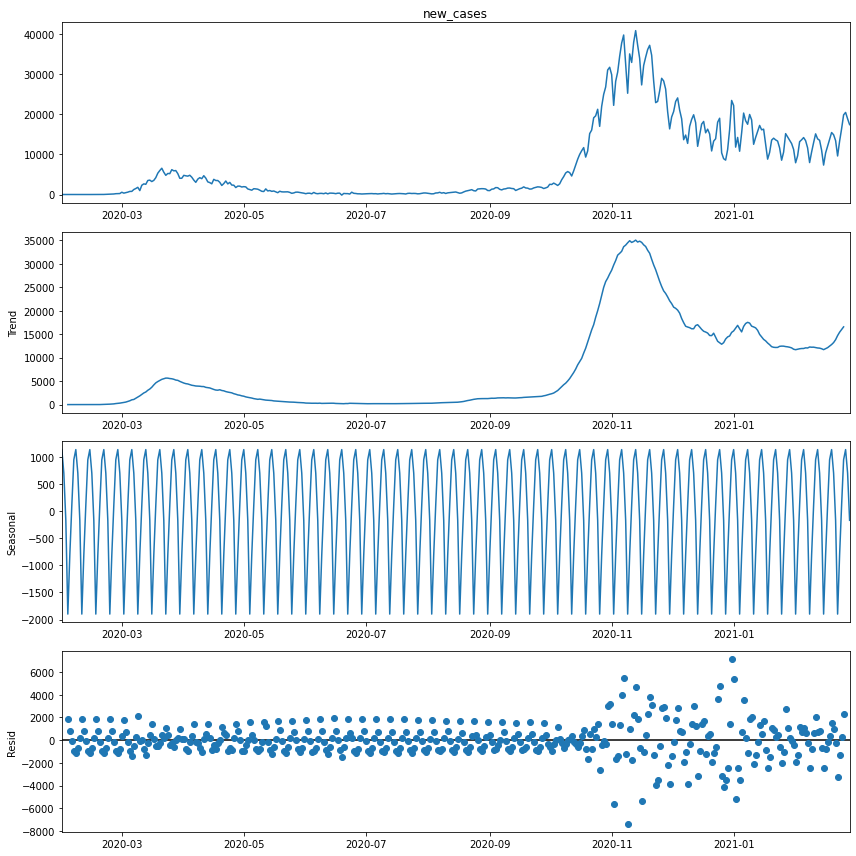

In [50]:
import statsmodels.api as sm

import matplotlib.pyplot as plt
%matplotlib inline
print('mean :' , ita['new_cases'].mean())
#res = sm.tsa.seasonal_decompose(occupancy.CO2)
res = sm.tsa.seasonal_decompose(ita['new_cases'],freq=7)

with plt.rc_context():
    plt.rc("figure", figsize=(12,12))
    res.plot()

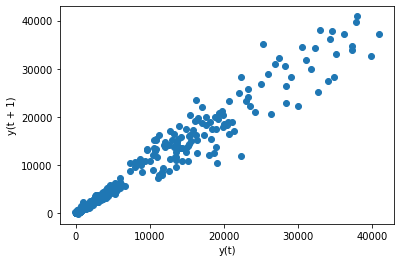

In [51]:
from pandas.plotting import lag_plot

lag_plot(ita['new_cases'])
# import matplotlib.pyplot as plt
# occupancy.plot(x=occupancy.CO2, y=occupancy.CO2)

## 3.2) Differencing
differencing comparison below shows that assigning 1 as differencing is my best option for lowering the noise and making my series have minimum standard deviation. When running auto_arima later you will see that the parameter d is always given as 1 by the model, confirming that this is as stationary as this time series can get.

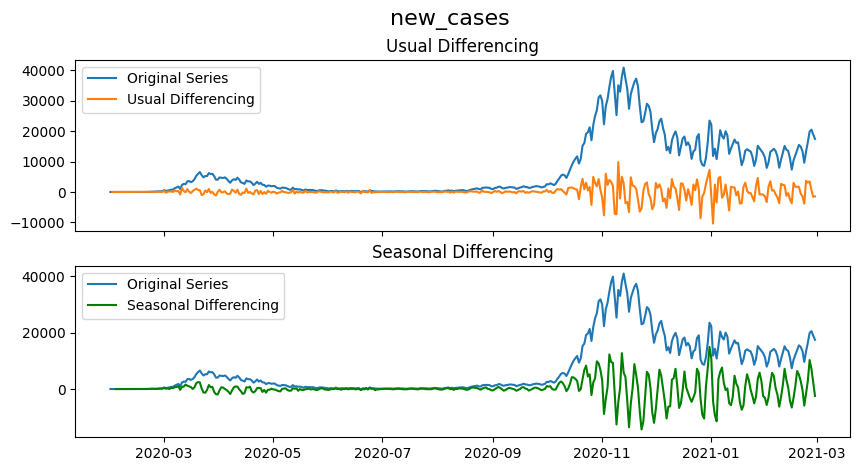

In [52]:
# Plot
fig, axes = plt.subplots(2, 1, figsize=(10,5), dpi=100, sharex=True)

# Usual Differencing
axes[0].plot(ita['new_cases'][:], label='Original Series')
axes[0].plot(ita['new_cases'][:].diff(1), label='Usual Differencing')
axes[0].set_title('Usual Differencing')
axes[0].legend(loc='upper left', fontsize=10)


# Seasonal Diff
axes[1].plot(ita['new_cases'][:], label='Original Series')
axes[1].plot(ita['new_cases'][:].diff(3), label='Seasonal Differencing', color='green')
axes[1].set_title('Seasonal Differencing')
plt.legend(loc='upper left', fontsize=10)
plt.suptitle('new_cases', fontsize=16)
plt.show()

I create another column when I shift my target Y of 7 days so that I can train my model using at each time, the value for 7 days ahead. I don't believe this is necessary by any means but I have observed this on other works and it might give more prediction power to the model. Next I drop my actual target.

In [53]:
steps=-7
predidf= ita.copy()
predidf['actual']=predidf['new_cases'].shift(steps)
predidf.tail(8)

,new_cases,new_vaccinations,stringency_index_x,stay_home_requirements,close_public_transport,cancel_public_events,facial_coverings,school_closures,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential,index,TEMP,HUMIDITY,WIND,actual
date,,,,,,,,,,,,,,,,,,,
2021-02-21,13450.0,49930.0,82.41,2.0,1.0,2.0,4.0,3.0,-31.143,-6.143,-1.429,-36.143,-23.143,8.714,59935.0,10.0,63.7,62.0,17440.0
2021-02-22,9617.0,103475.0,82.41,2.0,1.0,2.0,4.0,3.0,-31.143,-5.857,-0.286,-35.571,-22.429,8.429,59936.0,10.0,75.5,69.0,NaN
2021-02-23,13299.0,103032.0,82.41,2.0,1.0,2.0,4.0,3.0,-31.286,-5.571,1.429,-35.000,-21.857,8.286,59937.0,13.0,82.9,98.0,NaN
2021-02-24,16402.0,115898.0,82.41,2.0,1.0,2.0,4.0,3.0,0.000,0.000,0.000,0.000,0.000,0.000,59938.0,13.0,78.7,16.0,NaN
2021-02-25,19871.0,120580.0,82.41,2.0,1.0,2.0,4.0,3.0,0.000,0.000,0.000,0.000,0.000,0.000,59939.0,11.0,76.3,16.0,NaN
2021-02-26,20488.0,126193.0,82.41,2.0,1.0,2.0,4.0,3.0,0.000,0.000,0.000,0.000,0.000,0.000,59940.0,8.0,69.8,11.0,NaN
2021-02-27,18902.0,116123.0,82.41,2.0,1.0,2.0,4.0,3.0,0.000,0.000,0.000,0.000,0.000,0.000,59941.0,12.0,62.0,16.0,NaN
2021-02-28,17440.0,0.0,82.41,2.0,1.0,2.0,4.0,3.0,0.000,0.000,0.000,0.000,0.000,0.000,59942.0,10.0,51.1,15.0,NaN


In [54]:
predidf=predidf.dropna()
predidf['actual'].isna().sum()

0

In [55]:
# predidf['actual']=boxcox(predidf['actual'], 0.1226731859973334)
# predidf['actual']=(predidf['actual'].ffill() + predidf['actual'].bfill())/2

## 3.3) Train-Test Split and Scaling

I will hereby give 87% of my Y feature as train set to the model to work on as well as 87% of all my X features. I will keep the rest in order to assess accuracy of prediction.

In [56]:
#target
targ=pd.DataFrame(predidf['actual'])

#Xs
exo=predidf.drop(columns='actual')
exo=exo.drop(columns='new_cases')

In [57]:
train_size=int(len(ita) *0.87)
test_size = int(len(ita)) - train_size
train_X, train_y = exo[:train_size].dropna(), targ[:train_size].dropna()
test_X, test_y = exo[train_size:].dropna(), targ[train_size:].dropna()

I will scale my feature using two different scaling object as I do not want to contaminate my Xs with my Y. 
MIN-MAX scaler will reshape all features from 0 to 1. This is because machines will treat higher numbers as higher values and this is not wanted when simply comparing features on two different scaled. We want to see the individual impact on the Y regardless of their dimension. Imaging using one feature in km and another in ug/L.

In [58]:
#minmaxscaler with two differet object (one used on Xs, another on Ys so we can do the inverse later)

from sklearn.preprocessing import MinMaxScaler
sc_in = MinMaxScaler(feature_range=(0, 1))
train_X_scaled = sc_in.fit_transform(train_X)
train_X_scaled =pd.DataFrame(train_X_scaled)

test_X_scaled = sc_in.transform(test_X)
test_X_scaled =pd.DataFrame(test_X_scaled)

sc_out = MinMaxScaler(feature_range=(0, 1))
train_y_scaled = sc_out.fit_transform(train_y)
train_y_scaled =pd.DataFrame(train_y_scaled)

test_y_scaled = sc_out.transform(test_y)
test_y_scaled =pd.DataFrame(test_y_scaled)


In [59]:
train_X_scaled.rename(columns={0:'new_vaccinations', 1:'stringency_index_x', 2:'stay_home_requirements', 3:'close_public_transport', 
                  4:'cancel_public_events', 5:'facial_coverings', 6:'school_closures',7:'retail_and_recreation',
                  8:'grocery_and_pharmacy', 9:'parks',10:'transit_stations',11:'workplaces',12:'residential',
                  13:'index',14:'TEMP',15:'HUMIDITY',16:'WIND'}, inplace=True)
train_X_scaled.index=train_X.index

test_X_scaled.rename(columns={0:'new_vaccinations', 1:'stringency_index_x', 2:'stay_home_requirements', 3:'close_public_transport', 
                  4:'cancel_public_events', 5:'facial_coverings', 6:'school_closures',7:'retail_and_recreation',
                  8:'grocery_and_pharmacy', 9:'parks',10:'transit_stations',11:'workplaces',12:'residential',
                  13:'index',14:'TEMP',15:'HUMIDITY',16:'WIND'}, inplace=True)
test_X_scaled.index=test_X.index

In [60]:
train_y_scaled.rename(columns={0:'new_cases_next_week'}, inplace= True)
train_y_scaled.index=train_y.index
train_y_scaled.head(2)

test_y_scaled.rename(columns={0:'new_cases_next_week'}, inplace= True)
test_y_scaled.index=test_y.index
# test_y_scaled.head(2)

In [61]:
print(train_X.shape)
print(train_y.shape)

print(test_X.shape)
print(test_y.shape)

(343, 17)
(343, 1)
(45, 17)
(45, 1)


## 3.3) ADF test
augmented Dickey–Fuller test (ADF) tests the null hypothesis that a unit root is present in a time series sample. This is useful in understanding wheather my time series is stationary or not.
This is for understanding purposes as I will implement the auto_arima model which will automatically calulate and try different values of p,d,q.

In [62]:
from statsmodels.tsa.stattools import adfuller
def test_adf(series, title=''):
    dfout={}
    dftest=sm.tsa.adfuller(series.dropna(), autolag='AIC', regression='ct')
    for key,val in dftest[4].items():
        dfout[f'critical value ({key})']=val
    if dftest[1]<=0.05:
        print("Strong evidence against Null Hypothesis")
        print("Reject Null Hypothesis - Data is Stationary")
        print("Data is Stationary", title)
    else:
        print("Strong evidence for  Null Hypothesis")
        print("Accept Null Hypothesis - Data is not Stationary")
        print("Data is NOT Stationary for", title)

In [63]:
y_test=targ['actual'][:train_size].dropna()
test_adf(y_test, "new cases")

Strong evidence against Null Hypothesis
Reject Null Hypothesis - Data is Stationary
Data is Stationary new cases


In [64]:
# test_adf(y_test.diff(1), 'new cases')

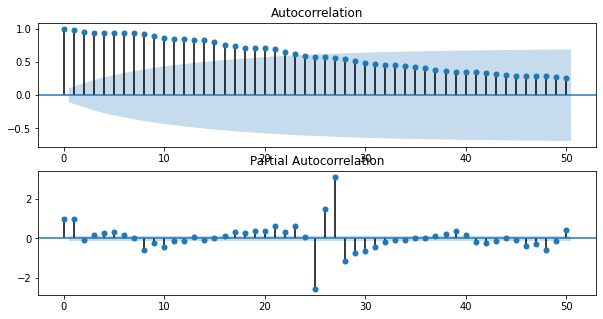

In [65]:
fig,ax= plt.subplots(2,1, figsize=(10,5))
fig=sm.tsa.graphics.plot_acf(y_test, lags=50, ax=ax[0])
fig=sm.tsa.graphics.plot_pacf(y_test, lags=50, ax=ax[1])
plt.show()

## 3.4) Auto_Arima
Automating the arima model to try different combinations of p,d,q and P,D,Q,S if a seasonal component if found.

In [66]:
from pmdarima.arima import auto_arima
model=auto_arima(train_y_scaled, 
                  exogenous= train_X_scaled,
                  start_p=1, start_q=1, 
                  max_p=7, max_q=7, 
                  d=1, max_d=7,
                  trace=True, 
                  error_action='ignore', 
                  # seasonal=True, m=1,
                  suppress_warnings=True, 
                  stepwise=True)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-1077.750, Time=2.03 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-1079.877, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-1079.389, Time=1.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-1079.726, Time=1.84 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-1081.596, Time=0.55 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 5.708 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  343
Model:               SARIMAX(0, 1, 0)   Log Likelihood                 558.798
Date:                Thu, 18 Mar 2021   AIC                          -1081.596
Time:                        20:37:48   BIC                          -1012.570
Sample:                    01-31-2020   HQIC                         -1054.098
                         - 01-07-2021                                  

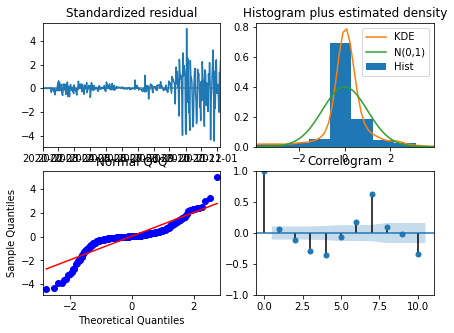

In [67]:
model.plot_diagnostics(figsize=(7,5))
plt.show()

## 3.5) Fitting the parameters
I will next feed the provided perameters and actually run the model (SARIMAX as family of models)

In [68]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
realmodel= SARIMAX(train_y_scaled, 
 exog=train_X_scaled,
 order=model.order,
 seasonal_order=model.seasonal_order,
 enforce_invertibility=False, enforce_stationarity=False)

In [69]:
results= realmodel.fit()
predictions= results.predict(start =train_size, end=train_size+test_size+(steps)-1,exog=test_X_scaled)

act= pd.DataFrame(test_y_scaled)

In [70]:
predictions=pd.DataFrame(predictions)
predictions.reset_index(drop=True, inplace=True)
predictions.index=test_X.index
predictions['new_cases_next_week'] = act['new_cases_next_week']
predictions.rename(columns={'predicted_mean':'predicted'}, inplace=True)

In [71]:
predictions['predicted']=predictions[(predictions['predicted'] > -0.5).replace(predictions['predicted'].mean())]

predictions=predictions.dropna()

In [72]:
# from scipy.special import boxcox, inv_boxcox

In [73]:
testPredict = pd.DataFrame(sc_out.inverse_transform(predictions[['predicted']]))
testActual = pd.DataFrame(sc_out.inverse_transform(predictions[['new_cases_next_week']]))

In [74]:
testActual.index = pd.DatetimeIndex(test_y.index, freq='infer')
testPredict.index = pd.DatetimeIndex(test_y.index, freq='infer')

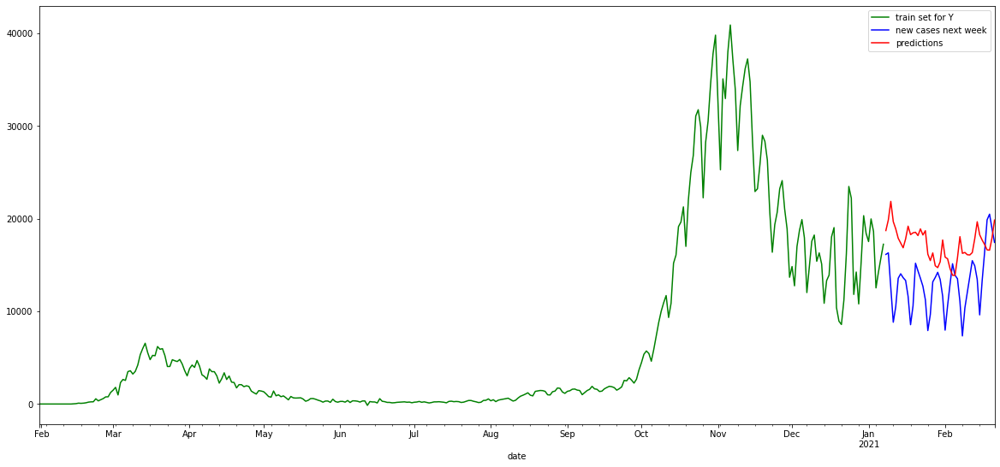

In [75]:
fig, ax = plt.subplots(figsize=(20,9))

train_y.plot(color='green', ax=ax)
testActual.plot(color='blue', ax=ax)
testPredict.plot(color='red', ax=ax)
ax.legend(['train set for Y','new cases next week','predictions'])

In [76]:
from statsmodels.tools.eval_measures import rmse
error=rmse(predictions['predicted'], predictions['new_cases_next_week'])
error

0.13198587098517423

## 3.6) First Results
I can observe that the first result (on Italy) seems to be quite ok and I have low error as well. More than the absolute values of predictions I am interested in correctly predicting the trend - whether that lowers or goes back up and eventual sudden peaks.

# 4) Automation
## 4.1) Building functions
I will next try to automate the whole process and build a single function out of it. It will be deployed on the dictionary containing all my countries as key - value combination.

### 4.1.1) NEW CASES function

In [77]:
def NEW(user_input):
  country=countries[user_input]
  country.index = pd.DatetimeIndex(country['date'], freq='infer')
  country= country.select_dtypes(include=np.number)
  country = country.drop(columns=to_drop)
  country = country.drop(columns=drop_constant)
  country = country.drop(columns=drop_vacc)
  country = country[(country[['new_cases']] > 0).all(axis=1)]

  res = sm.tsa.seasonal_decompose(country['new_cases'],freq=7)
  with plt.rc_context():
      plt.rc("figure", figsize=(12,12))
      print(res.plot())

  steps=-7
  predidf= country.copy()
  predidf['actual']=predidf['new_cases'].shift(steps)
  predidf=predidf.dropna()
  predidf['actual'].isna().sum()

  targ=pd.DataFrame(predidf['actual'])
  exo=predidf.drop(columns='actual')
  exo=exo.drop(columns='new_cases')

  train_size=int(len(country) *0.87)
  test_size = int(len(country)) - train_size
  train_X, train_y = exo[:train_size].dropna(), targ[:train_size].dropna()
  test_X, test_y = exo[train_size:].dropna(), targ[train_size:].dropna()

  sc_in = MinMaxScaler(feature_range=(0, 1))
  train_X_scaled = sc_in.fit_transform(train_X)
  train_X_scaled =pd.DataFrame(train_X_scaled)

  test_X_scaled = sc_in.transform(test_X)
  test_X_scaled =pd.DataFrame(test_X_scaled)

  sc_out = MinMaxScaler(feature_range=(0, 1))
  train_y_scaled = sc_out.fit_transform(train_y)
  train_y_scaled =pd.DataFrame(train_y_scaled)

  test_y_scaled = sc_out.transform(test_y)
  test_y_scaled =pd.DataFrame(test_y_scaled)

  train_X_scaled.rename(columns={0:'tests_per_case', 1:'stringency_index_x', 2:'stay_home_requirements', 3:'close_public_transport', 
                  4:'cancel_public_events', 5:'facial_coverings', 6:'school_closures',7:'retail_and_recreation',
                  8:'grocery_and_pharmacy', 9:'parks',10:'transit_stations',11:'workplaces',12:'residential',
                  13:'index',14:'TEMP',15:'HUMIDITY',16:'WIND'}, inplace=True)
  train_X_scaled.index=train_X.index

  test_X_scaled.rename(columns={0:'tests_per_case', 1:'stringency_index_x', 2:'stay_home_requirements', 3:'close_public_transport', 
                    4:'cancel_public_events', 5:'facial_coverings', 6:'school_closures',7:'retail_and_recreation',
                    8:'grocery_and_pharmacy', 9:'parks',10:'transit_stations',11:'workplaces',12:'residential',
                    13:'index',14:'TEMP',15:'HUMIDITY',16:'WIND'}, inplace=True)
  test_X_scaled.index=test_X.index

  train_y_scaled.rename(columns={0:'new_cases_next_week'}, inplace= True)
  train_y_scaled.index=train_y.index
  
  test_y_scaled.rename(columns={0:'new_cases_next_week'}, inplace= True)
  test_y_scaled.index=test_y.index

  model=auto_arima(train_y_scaled, 
                  exogenous= train_X_scaled,
                  start_p=1, start_q=1, 
                  max_p=7, max_q=7, 
                  d=1, max_d=7,
                  trace=True, 
                  error_action='ignore', 
                  # seasonal=True, m=1,
                  suppress_warnings=True, 
                  stepwise=True)
  print(model.summary())

  model.plot_diagnostics(figsize=(7,5))
  print(plt.show())

  realmodel= SARIMAX(train_y_scaled, 
  exog=train_X_scaled,
  order=model.order,
  seasonal_order=model.seasonal_order,
  enforce_invertibility=False, enforce_stationarity=False)

  results= realmodel.fit()

  predictions= results.predict(start =train_size, end=train_size+test_size+(steps)-1,exog=test_X_scaled)
  act= pd.DataFrame(test_y_scaled)

  predictions=pd.DataFrame(predictions)
  predictions.reset_index(drop=True, inplace=True)
  predictions.index=test_X.index
  predictions['new_cases_next_week'] = act['new_cases_next_week']
  predictions.rename(columns={'predicted_mean':'predicted'}, inplace=True)

  predictions['predicted']=predictions[(predictions['predicted'] > -0.5).replace(predictions['predicted'].mean())]
  predictions=predictions.dropna()

  testPredict = pd.DataFrame(sc_out.inverse_transform(predictions[['predicted']]))
  testActual = pd.DataFrame(sc_out.inverse_transform(predictions[['new_cases_next_week']]))
  testActual.index = pd.DatetimeIndex(test_y.index, freq='infer')
  testPredict.index = pd.DatetimeIndex(test_y.index, freq='infer')

  fig, ax = plt.subplots(figsize=(20,9))
  print(train_y.plot(color='green', ax=ax))
  print(testActual.plot(color='blue', ax=ax))
  print(testPredict.plot(color='red', ax=ax))
  print(ax.legend(['train set for Y','test set for Y','predictions']))

  error=rmse(predictions['predicted'], predictions['new_cases_next_week'])
  print('error is: ', error)

### 4.1.2) TOTAL CASES function

In [78]:
def total(user_input):
  country=countries[user_input]
  country.index = pd.DatetimeIndex(country['date'], freq='infer')
  country= country.select_dtypes(include=np.number)
  country = country.drop(columns=to_drop2)
  country = country.drop(columns=drop_constant)
  country = country.drop(columns=drop_vacc)
  country = country[(country[['total_cases']] > 0).all(axis=1)]

  res = sm.tsa.seasonal_decompose(country['total_cases'],freq=7)
  with plt.rc_context():
      plt.rc("figure", figsize=(12,12))
      print(res.plot())

  steps=-7
  predidf= country.copy()
  predidf['actual']=predidf['total_cases'].shift(steps)
  predidf=predidf.dropna()
  predidf['actual'].isna().sum()

  targ=pd.DataFrame(predidf['actual'])
  exo=predidf.drop(columns='actual')
  exo=exo.drop(columns='total_cases')

  train_size=int(len(country) *0.87)
  test_size = int(len(country)) - train_size
  train_X, train_y = exo[:train_size].dropna(), targ[:train_size].dropna()
  test_X, test_y = exo[train_size:].dropna(), targ[train_size:].dropna()

  sc_in = MinMaxScaler(feature_range=(0, 1))
  train_X_scaled = sc_in.fit_transform(train_X)
  train_X_scaled =pd.DataFrame(train_X_scaled)

  test_X_scaled = sc_in.transform(test_X)
  test_X_scaled =pd.DataFrame(test_X_scaled)

  sc_out = MinMaxScaler(feature_range=(0, 1))
  train_y_scaled = sc_out.fit_transform(train_y)
  train_y_scaled =pd.DataFrame(train_y_scaled)

  test_y_scaled = sc_out.transform(test_y)
  test_y_scaled =pd.DataFrame(test_y_scaled)

  train_X_scaled.rename(columns={0:'tests_per_case', 1:'stringency_index_x', 2:'stay_home_requirements', 3:'close_public_transport', 
                  4:'cancel_public_events', 5:'facial_coverings', 6:'school_closures',7:'retail_and_recreation',
                  8:'grocery_and_pharmacy', 9:'parks',10:'transit_stations',11:'workplaces',12:'residential',
                  13:'index',14:'TEMP',15:'HUMIDITY',16:'WIND'}, inplace=True)
  train_X_scaled.index=train_X.index

  test_X_scaled.rename(columns={0:'tests_per_case', 1:'stringency_index_x', 2:'stay_home_requirements', 3:'close_public_transport', 
                    4:'cancel_public_events', 5:'facial_coverings', 6:'school_closures',7:'retail_and_recreation',
                    8:'grocery_and_pharmacy', 9:'parks',10:'transit_stations',11:'workplaces',12:'residential',
                    13:'index',14:'TEMP',15:'HUMIDITY',16:'WIND'}, inplace=True)
  test_X_scaled.index=test_X.index

  train_y_scaled.rename(columns={0:'new_cases_next_week'}, inplace= True)
  train_y_scaled.index=train_y.index
  
  test_y_scaled.rename(columns={0:'new_cases_next_week'}, inplace= True)
  test_y_scaled.index=test_y.index

  model=auto_arima(train_y_scaled, 
                  exogenous= train_X_scaled,
                  start_p=1, start_q=1, 
                  max_p=7, max_q=7, 
                  d=1, max_d=7,
                  trace=True, 
                  error_action='ignore', 
                  # seasonal=True, m=1,
                  suppress_warnings=True, 
                  stepwise=True)
  print(model.summary())

  model.plot_diagnostics(figsize=(7,5))
  print(plt.show())

  realmodel= SARIMAX(train_y_scaled, 
  exog=train_X_scaled,
  order=model.order,
  seasonal_order=model.seasonal_order,
  enforce_invertibility=False, enforce_stationarity=False)

  results= realmodel.fit()

  predictions= results.predict(start =train_size, end=train_size+test_size+(steps)-1,exog=test_X_scaled)
  act= pd.DataFrame(test_y_scaled)

  predictions=pd.DataFrame(predictions)
  predictions.reset_index(drop=True, inplace=True)
  predictions.index=test_X.index
  predictions['new_cases_next_week'] = act['new_cases_next_week']
  predictions.rename(columns={'predicted_mean':'predicted'}, inplace=True)

  predictions['predicted']=predictions[(predictions['predicted'] > -0.5).replace(predictions['predicted'].mean())]
  predictions=predictions.dropna()

  testPredict = pd.DataFrame(sc_out.inverse_transform(predictions[['predicted']]))
  testActual = pd.DataFrame(sc_out.inverse_transform(predictions[['new_cases_next_week']]))
  testActual.index = pd.DatetimeIndex(test_y.index, freq='infer')
  testPredict.index = pd.DatetimeIndex(test_y.index, freq='infer')

  fig, ax = plt.subplots(figsize=(20,9))
  print(train_y.plot(color='green', ax=ax))
  print(testActual.plot(color='blue', ax=ax))
  print(testPredict.plot(color='red', ax=ax))
  print(ax.legend(['train set for Y','test set for Y','predictions']))

  error=rmse(predictions['predicted'], predictions['new_cases_next_week'])
  print('error is: ', error)

## 4.2) Choosing a country -Input

In [79]:
# user_input=input()

In [80]:
# NEW(user_input)

In [81]:
# total(user_input)

## 4.3) Out-of-Sample Prediction (test case Italy)

So far I have predicted **In-Sample** meaning in an observable past (future to the model has it has never seen those data) so we can verify that the observation are correct. 

Once we are certain of our model(s) we can perform **Out-of-Sample** predictions - we don't have a way of verifying this is actually right because it hasn't happened yet. So we evaluate based on previous confidence in th model.

In the DF 'Italia' I had to manually infer that (on Excel):
* vaccination rate in the future will stay at least constant
* Measure adopted will become less stringent as summer approach, including facial covering and opening of schools and workplaces
* I have weather forecast for the next year 

In out of sample predictions, when you want to use your features Xs in order to predict you need to have them in the future. Otherwise it becomes a simple ARIMA or ARMA (no exogenous).

## I will print what my model predicts will happen in the next:
## * 30 days
## * 5 months

In [85]:
link10 = 'https://drive.google.com/file/d/1GZydSr895nA0BJVCZzMYTb9zqkl_gUG9/view?usp=sharing'
id10 = '1GZydSr895nA0BJVCZzMYTb9zqkl_gUG9'
downloaded = drive.CreateFile({'id':id10}) 
downloaded.GetContentFile('italy.csv')  
italia = pd.read_csv('italy.csv')

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


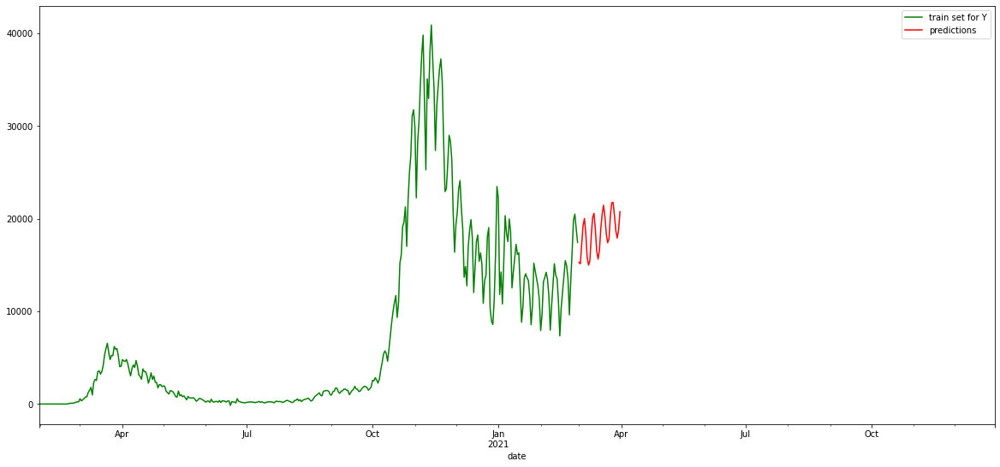

In [83]:
dateita=italia.copy()
italia.index = pd.DatetimeIndex(italia['date'], freq='D')
italia=italia.drop(columns='date')
italia= italia.select_dtypes(include=np.number)

train_y=italia['new_cases'].loc['2020-01-31':'2021-02-28']
xs=italia.drop(columns='new_cases')
train_X=xs.loc['2020-01-31':'2021-02-28']
test_X=xs.loc['2021-02-28':'2021-03-30']

train_y=pd.DataFrame(train_y)
train_y=train_y['new_cases'].fillna(np.mean(train_y['new_cases']))
train_y=train_y.dropna()

model=auto_arima(train_y,
                 exogenous=train_X 
                 )


realmodel= SARIMAX(train_y,
                    exog= train_X,
                    order=model.order,
                    seasonal_order=model.seasonal_order,
                    out_of_sample_size = 30
                    )

results= realmodel.fit()

predictions= results.predict(start =len(train_y), end=len(train_y)+30, exog=test_X)

predictions.index = pd.DatetimeIndex(dateita['date'][395:426], freq='D')

predictions=pd.DataFrame(predictions)

fig, ax = plt.subplots(figsize=(20,9))

italia['new_cases'].plot(color='green', ax=ax)
predictions.plot(color='red', ax=ax)
ax.legend(['train set for Y', 'predictions'])

In [ ]:
link10 = 'https://drive.google.com/file/d/1GZydSr895nA0BJVCZzMYTb9zqkl_gUG9/view?usp=sharing'
id10 = '1GZydSr895nA0BJVCZzMYTb9zqkl_gUG9'
downloaded = drive.CreateFile({'id':id10}) 
downloaded.GetContentFile('italy.csv')  
italia = pd.read_csv('italy.csv')

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


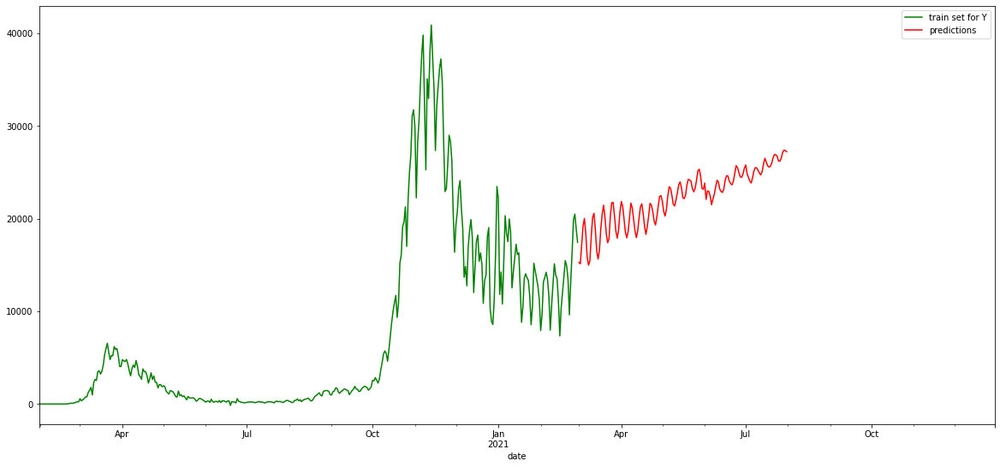

In [86]:
dateita=italia.copy()
italia.index = pd.DatetimeIndex(italia['date'], freq='D')
italia=italia.drop(columns='date')
italia= italia.select_dtypes(include=np.number)

train_y=italia['new_cases'].loc['2020-01-31':'2021-02-28']
xs=italia.drop(columns='new_cases')
train_X=xs.loc['2020-01-31':'2021-02-28']
test_X=xs.loc['2021-02-28':'2021-07-30']

train_y=pd.DataFrame(train_y)
train_y=train_y['new_cases'].fillna(np.mean(train_y['new_cases']))
train_y=train_y.dropna()

model=auto_arima(train_y,
                 exogenous=train_X 
                 )


realmodel= SARIMAX(train_y,
                    exog= train_X,
                    order=model.order,
                    seasonal_order=model.seasonal_order,
                    out_of_sample_size = 152
                    )

results= realmodel.fit()

predictions= results.predict(start =len(train_y), end=len(train_y)+152, exog=test_X)

predictions.index = pd.DatetimeIndex(dateita['date'][395:548], freq='D')

predictions=pd.DataFrame(predictions)

fig, ax = plt.subplots(figsize=(20,9))

italia['new_cases'].plot(color='green', ax=ax)
predictions.plot(color='red', ax=ax)
ax.legend(['train set for Y', 'predictions'])

In [ ]:
# italia=italia.drop(columns='Unnamed: 0')
# italia.index = pd.DatetimeIndex(italia['date'], freq='infer')
# italia=italia.drop(columns='date')
# italia=italia.drop(columns='total_cases')

# italia=italia[~italia['total_vaccinations'].isna()]
# italia= italia.select_dtypes(include=np.number)

# test_X = italia[italia['new_cases'].isna()].drop(columns='new_cases')
# italia = italia[(~italia['new_cases'].isna()) & ((italia[['new_cases']] >= 0).all(axis=1))]

# #italia = italia[(italia[['new_cases']] > 0).all(axis=1)]

# # res = sm.tsa.seasonal_decompose(italia['new_cases'],freq=7)
# # with plt.rc_context():
# #     plt.rc("figure", figsize=(12,12))
# #     print(res.plot())

# # steps=-7
# # predidf= italia.copy()
# # predidf['actual']=predidf['new_cases'].shift(steps)
# # predidf=predidf.dropna()
# # predidf['actual'].isna().sum()

# train_X, train_y = italia.drop(columns='new_cases'), italia['new_cases']
# train_y=pd.DataFrame(train_y)

# sc_in = MinMaxScaler(feature_range=(0, 1))
# train_X_scaled = sc_in.fit_transform(train_X)
# train_X_scaled =pd.DataFrame(train_X_scaled)

# test_X_scaled = sc_in.transform(test_X)
# test_X_scaled =pd.DataFrame(test_X_scaled)

# sc_out = MinMaxScaler(feature_range=(0, 1))
# train_y_scaled = sc_out.fit_transform(train_y)
# train_y_scaled =pd.DataFrame(train_y_scaled)

# train_X_scaled.rename(columns={0:'total_cases', 1:'total_vaccinations', 2:'stringency_index', 3:'stay_home_requirements', 
#                 4:'close_public_transport', 5:'cancel_public_events', 6:'facial_coverings',7:'school_closures',
#                 8:'TEMP', 9:'HUMIDITY',10:'WIND'}, inplace=True)
# train_X_scaled.index=train_X.index

# test_X_scaled.rename(columns={0:'total_cases', 1:'total_vaccinations', 2:'stringency_index', 3:'stay_home_requirements', 
#                 4:'close_public_transport', 5:'cancel_public_events', 6:'facial_coverings',7:'school_closures',
#                 8:'TEMP', 9:'HUMIDITY',10:'WIND'}, inplace=True)
# test_X_scaled.index=test_X.index

# train_y_scaled.rename(columns={0:'new_cases_next_week'}, inplace= True)
# train_y_scaled.index=train_y.index

# model=auto_arima(train_y_scaled, 
#                 exogenous= train_X_scaled,
#                 start_p=1, start_q=1, 
#                 max_p=7, max_q=7, 
#                 d=1, max_d=7,
#                 trace=True, 
#                 error_action='ignore', 
#                 # seasonal=True, m=1,
#                 suppress_warnings=True, 
#                 stepwise=True,
#                 out_of_sample_size = len(test_X))
# print(model.summary())

# model.plot_diagnostics(figsize=(7,5))
# print(plt.show())

# realmodel= SARIMAX(train_y_scaled, 
# exog=train_X_scaled,
# order=model.order,
# seasonal_order=model.seasonal_order,
# enforce_invertibility=False, enforce_stationarity=False)

# results= realmodel.fit()

# predictions= results.predict(start =len(train_X), end=len(train_X)+len(test_X)-1, exog=test_X_scaled)
# # predictions= results.predict(start =len(train_X), end=len(train_X)+(len(test_X)+(steps)-1), exog=test_X_scaled)

# predictions=pd.DataFrame(predictions)
# predictions.reset_index(drop=True, inplace=True)
# predictions.index=test_X.index
# predictions.rename(columns={'predicted_mean':'predicted'}, inplace=True)

# predictions['predicted']=predictions[(predictions['predicted'] > -0.5).replace(predictions['predicted'].mean())]
# predictions=predictions.dropna()

# testPredict = pd.DataFrame(sc_out.inverse_transform(predictions[['predicted']]))
# testPredict.index = pd.DatetimeIndex(test_X.index, freq='infer')

# fig, ax = plt.subplots(figsize=(20,9))
# print(train_y.plot(color='green', ax=ax))
# print(testPredict.plot(color='red', ax=ax))
# print(ax.legend(['train set for Y','predictions']))

# 5) Validation
I will now use calculated root mean squared error calulated on every country prediction in order to assess my overall performance. 

It will be seen that some countries are badly predicted and this will drive my max errors and in turn my average error upward. Distributing the errors instead will show that most of them are closely stacked near the 0 therefore validating my model.

In the future I would like to perform a walk forward validation - gold standard for time series validation. Time constraints prevent me from doing it here and now.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3896.570, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4036.894, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3961.514, Time=1.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3894.828, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4034.899, Time=0.50 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3896.646, Time=1.84 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3887.986, Time=1.89 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3889.654, Time=2.00 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3889.400, Time=2.06 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3895.516, Time=2.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3896.077, Time=2.01 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3901.601, Time=2.38 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3885.954, Time=1.70 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3894.526, Time=1.68 sec
 ARIMA(1,1,1)(0,0,0)[0]          

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Afghanistan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5788.354, Time=1.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5817.396, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5819.276, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5819.245, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5815.771, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5768.581, Time=1.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5815.813, Time=0.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5740.920, Time=1.33 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5789.010, Time=0.29 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5722.836, Time=0.54 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5754.427, Time=0.51 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5687.376, Time=1.05 sec
 ARIMA(5,1,0)(0,0,0)[0] in

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Africa')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3589.072, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.438 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Albania')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3219.331, Time=1.97 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3242.142, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3229.990, Time=1.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3235.221, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3240.278, Time=0.89 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3194.599, Time=2.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3208.782, Time=1.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3195.765, Time=2.44 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3214.598, Time=2.84 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3209.104, Time=1.05 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3197.125, Time=2.21 sec
 ARIMA(2,1,1)(0,0,0)[0]            

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Algeria')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1998.024, Time=1.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2051.825, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2020.803, Time=0.72 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1996.556, Time=1.24 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2049.852, Time=0.36 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1997.882, Time=1.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1998.348, Time=1.52 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1994.187, Time=1.25 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1995.638, Time=1.25 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1995.409, Time=1.20 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2018.801, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1996.006, Time=1.43 sec

Best model:  ARIMA(0,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Andorra')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2717.930, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2828.697, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2773.250, Time=0.87 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2714.703, Time=1.47 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2826.742, Time=0.46 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2717.326, Time=1.51 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2718.035, Time=1.70 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2713.690, Time=1.37 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2715.669, Time=1.44 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2716.020, Time=1.43 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2771.330, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2716.065, Time=1.69 sec

Best model:  ARIMA(0,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Angola')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=624.170, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=677.002, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=648.776, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=625.857, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=675.442, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=624.734, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=629.286, Time=0.94 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=622.462, Time=0.86 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=618.391, Time=0.95 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=618.377, Time

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Antigua and Barbuda')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5562.622, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5578.791, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5574.004, Time=0.33 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5571.658, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5577.031, Time=0.61 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5520.971, Time=1.91 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5562.948, Time=1.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5509.909, Time=2.05 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5536.790, Time=2.01 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5503.686, Time=2.31 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5517.470, Time=2.18 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5481.733, Time=2.54 sec
 ARIMA(5,1,0)(0,0,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Argentina')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4410.136, Time=1.56 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4449.668, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4450.772, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4449.119, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4447.672, Time=1.00 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4383.124, Time=1.87 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4421.859, Time=1.23 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4382.470, Time=2.01 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4416.612, Time=0.59 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4359.618, Time=2.16 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4396.577, Time=0.89 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4309.370, Time=2.41 sec
 ARIMA(5,1,0)(0,0,0)[0] inte

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Armenia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=7162.896, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=7209.071, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=7192.500, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=7172.643, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8902.911, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=7157.499, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=7175.019, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=7156.608, Time=0.51 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=7169.038, Time=0.25 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=7150.333, Time=0.58 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=7160.518, Time=0.41 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=7136.473, Time=0.72 sec
 ARIMA(5,1,0)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
Text(0.5, 1.0, 'Asia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3592.515, Time=1.96 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3725.073, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3640.545, Time=1.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3597.553, Time=1.80 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3723.074, Time=0.62 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3567.506, Time=2.00 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3565.569, Time=1.86 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3567.228, Time=2.01 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3569.261, Time=2.24 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=3564.505, Time=1.87 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3637.758, Time=0.97 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=3565.248, Time=1.89 sec
 ARIMA(2,1,1)(0,0,0)[0] 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Australia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4991.906, Time=1.83 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5002.633, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5003.332, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5002.453, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5000.670, Time=0.52 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4958.239, Time=1.89 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4987.888, Time=1.86 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4949.494, Time=2.04 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4973.164, Time=1.93 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4923.853, Time=2.35 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4927.385, Time=2.25 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4919.787, Time=2.74 sec
 ARIMA(5,1,0)(0,0,0)[0] inte

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Austria')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4426.658, Time=1.80 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4498.262, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4427.394, Time=1.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4432.815, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4496.278, Time=0.49 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4428.454, Time=1.86 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4397.639, Time=2.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4425.643, Time=1.60 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4395.087, Time=2.20 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4364.542, Time=2.26 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4419.953, Time=2.19 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=4392.530, Time=2.63 sec
 ARIMA(3,1,3)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Azerbaijan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2075.612, Time=0.44 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.445 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Bahamas')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3760.364, Time=1.79 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3847.501, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3791.124, Time=1.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3757.698, Time=1.72 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3845.505, Time=0.72 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3760.468, Time=1.91 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3759.218, Time=2.02 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3755.724, Time=1.60 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3757.844, Time=1.69 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3759.432, Time=1.71 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3789.179, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3759.816, Time=1.96 sec

Best model:  ARIMA(0,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Bahrain')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4395.547, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4428.641, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4416.383, Time=0.81 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4409.020, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4426.819, Time=0.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4396.311, Time=1.77 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4396.928, Time=1.94 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4397.189, Time=1.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4412.760, Time=1.67 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4394.694, Time=1.63 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4407.427, Time=1.67 sec
 ARIMA(1,1,0)(0,0,0)[0]            

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Bangladesh')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1526.986, Time=1.36 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1605.051, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1570.076, Time=0.67 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1524.460, Time=1.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1603.112, Time=0.51 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1526.615, Time=1.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1527.187, Time=1.52 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1523.269, Time=1.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1525.760, Time=1.23 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1525.176, Time=1.24 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1568.077, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1530.734, Time=1.32 sec

Best model:  ARIMA(0,1,1)(

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Barbados')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3671.936, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3716.661, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3699.246, Time=1.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3679.874, Time=1.64 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3715.543, Time=0.60 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3671.533, Time=1.96 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3676.512, Time=1.86 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3672.411, Time=2.01 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3667.717, Time=2.01 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3665.764, Time=2.06 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3670.053, Time=1.83 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3667.877, Time=2.26 sec
 ARIMA(0,1,3)(0,0,0)[0] inter

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Belarus')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5508.499, Time=1.84 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5515.369, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5515.920, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5514.817, Time=1.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5513.373, Time=0.84 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5482.755, Time=1.89 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5498.446, Time=1.38 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5482.866, Time=2.03 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5433.683, Time=2.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=5488.602, Time=1.98 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=5436.324, Time=2.35 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept  

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Belgium')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2399.466, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.311 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Belize')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=961.756, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.157 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Benin')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=992.700, Time=1.39 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1008.226, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=991.282, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=989.989, Time=1.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1007.381, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=991.515, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=994.142, Time=0.99 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=988.001, Time=0.86 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=991.200, Time=0.59 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=989.530, Time=0.84 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=989.288, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=992.150, Time=0.93 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]      

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Bhutan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4289.377, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4345.623, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4311.527, Time=0.99 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4298.129, Time=1.71 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4343.699, Time=0.70 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4290.749, Time=1.99 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4292.070, Time=1.93 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4291.592, Time=1.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4311.655, Time=1.88 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.04 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4287.955, Time=1.76 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4296.863, Time=1.54 sec
 ARIMA(1,1,0)(0,0,0)[0]             

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Bolivia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3777.277, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3835.890, Time=0.56 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3821.270, Time=0.98 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3789.929, Time=1.54 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3834.003, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3772.132, Time=1.77 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3800.051, Time=1.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3772.293, Time=1.87 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3731.700, Time=1.85 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3789.527, Time=1.72 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3739.454, Time=2.16 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3717.008, Time=2.20 sec
 ARIMA(1,1,3)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Bosnia and Herzegovina')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1077.013, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1038.244, Time=0.43 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1075.013, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1038.746, Time=0.70 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1036.192, Time=0.43 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=1038.049, Time=0.73 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=inf, Time=0.79 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=inf, Time=0.65 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=inf, Time=0.73 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Botswana')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=6847.391, Time=1.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=6902.515, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=6904.475, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=6904.448, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8410.111, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=6809.933, Time=1.98 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=6883.706, Time=0.91 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=6811.310, Time=0.91 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=6835.460, Time=1.94 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=6817.050, Time=1.98 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=6873.257, Time=0.56 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=6814.966, Time=2.09 sec
 ARIMA(2,1,1)(0,0,0)[0]      

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Brazil')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=258.690, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=278.073, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=267.908, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=256.047, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=276.077, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=256.761, Time=0.64 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=255.639, Time=0.54 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=258.245, Time=0.61 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=258.182, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=265.931, Time=0.36 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=259.004, Time=0.68 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4823.683, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4854.315, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4855.756, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4843.336, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4852.328, Time=0.60 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4751.851, Time=1.87 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4755.148, Time=1.80 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4753.910, Time=2.00 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4713.029, Time=1.89 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4732.535, Time=1.82 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4785.763, Time=1.90 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4676.210, Time=2.33 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4746.420, Time=2.24 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=4657.751, Time=2.49 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Bulgaria')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2467.648, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2572.572, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2495.207, Time=0.88 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2464.394, Time=1.53 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2570.575, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2468.147, Time=1.62 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2465.744, Time=1.76 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2463.022, Time=1.53 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2466.365, Time=1.46 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2466.516, Time=1.48 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2493.040, Time=0.94 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2464.116, Time=1.76 sec

Best model:  ARIMA(0,1,1)(0,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Burkina Faso')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1246.575, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1273.441, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1255.261, Time=0.62 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1234.061, Time=1.57 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1271.458, Time=0.34 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1240.431, Time=1.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1248.714, Time=1.20 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1223.668, Time=1.06 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1239.615, Time=1.00 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1231.085, Time=1.12 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1255.134, Time=0.64 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1241.356, Time=1.15 sec

Best model:  ARIMA(0,1,1

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Burundi')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=783.118, Time=1.47 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=839.429, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=811.072, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=788.932, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1312.410, Time=0.18 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=786.271, Time=1.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=789.318, Time=1.16 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=784.220, Time=1.65 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=785.649, Time=1.76 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=787.143, Time=1.29 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=783.796, Time=1.10 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 11.520 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Cambodia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1778.690, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.169 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Cameroon')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5636.240, Time=1.94 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5737.069, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5714.092, Time=1.00 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5640.142, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5735.074, Time=0.59 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5612.242, Time=1.96 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5632.935, Time=1.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5615.564, Time=1.95 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5617.424, Time=1.97 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5612.813, Time=2.04 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5621.078, Time=2.05 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=5612.191, Time=2.06 sec
 ARIMA(4,1,2)(0,0,0)[0] inter

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Canada')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2663.309, Time=0.39 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.394 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Cape Verde')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1269.856, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.200 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Central African Republic')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1880.550, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1988.779, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1909.304, Time=0.76 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1891.026, Time=1.49 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3107.116, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1871.079, Time=1.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1864.806, Time=2.08 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1866.349, Time=1.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1870.504, Time=1.17 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=1863.071, Time=1.65 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1907.357, Time=1.09 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=1864.628, Time=1.73 sec
 ARIMA(2,1,1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Chad')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5465.672, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5605.240, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5531.678, Time=1.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5463.732, Time=1.75 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5603.262, Time=0.58 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5463.313, Time=1.76 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5465.014, Time=1.99 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=5466.948, Time=2.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=5441.169, Time=2.22 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=5422.523, Time=2.59 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5468.416, Time=2.19 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=5399.990, Time=2.48 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Chile')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5858.225, Time=0.56 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.563 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'China')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5273.953, Time=1.86 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5293.290, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5289.232, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5287.448, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5291.468, Time=0.46 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5275.193, Time=1.76 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5277.454, Time=2.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5275.514, Time=1.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5288.356, Time=1.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5281.080, Time=2.45 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=5272.392, Time=1.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=5285.695, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Colombia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1259.640, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.186 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Comoros')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=914.384, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=935.490, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=931.532, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=933.500, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=914.818, Time=0.88 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=920.413, Time=0.80 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=917.984, Time=0.87 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=911.727, Time=0.72 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=911.361, Time=0.71 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=908.813, Tim

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Congo')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4019.731, Time=1.96 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4227.071, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4110.660, Time=0.94 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4022.433, Time=1.87 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4226.549, Time=0.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.92 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4014.406, Time=1.91 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4026.399, Time=2.10 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=2.23 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=4013.423, Time=1.56 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4026.083, Time=1.73 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=4009.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Costa Rica')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3230.040, Time=1.92 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3297.706, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3259.114, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3228.412, Time=1.67 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3295.745, Time=0.76 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3229.385, Time=1.90 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3231.805, Time=1.84 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3226.166, Time=1.65 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3227.772, Time=1.75 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3227.470, Time=1.81 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3257.161, Time=0.29 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3228.383, Time=1.79 sec

Best model:  ARIMA(0,1,1)(

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, "Cote d'Ivoire")
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4644.068, Time=1.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4661.611, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4656.879, Time=0.79 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4647.546, Time=1.84 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4659.615, Time=0.78 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4555.255, Time=1.93 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4611.306, Time=2.02 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4551.666, Time=2.09 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4600.291, Time=2.01 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4509.061, Time=2.37 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4551.728, Time=2.35 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4436.592, Time=2.64 sec
 ARIMA(5,1,0)(0,0,0)[0] 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Croatia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3073.508, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3157.589, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3081.619, Time=1.16 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3074.976, Time=1.71 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3156.094, Time=1.00 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3072.731, Time=2.00 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3070.507, Time=1.89 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3069.980, Time=1.66 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3055.325, Time=4.72 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3057.482, Time=2.86 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3058.215, Time=2.62 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3068.469, Time=2.16 sec
 ARIMA(5,1,1)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Cuba')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3468.712, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3518.915, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3514.330, Time=0.33 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3493.373, Time=1.61 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3516.960, Time=0.71 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3456.906, Time=1.64 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3471.614, Time=1.09 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3456.297, Time=2.02 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3471.824, Time=1.04 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3447.764, Time=1.88 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3445.719, Time=1.89 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3447.602, Time=2.57 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Cyprus')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5761.559, Time=1.95 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5794.966, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5792.922, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5790.445, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5792.970, Time=0.80 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5709.870, Time=2.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5776.251, Time=1.87 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5694.138, Time=2.01 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5752.113, Time=1.99 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5658.109, Time=2.31 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5694.264, Time=2.40 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5626.264, Time=2.70 sec
 ARIMA(5,1,0)(0,0,0)[0] interce

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Czechia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3025.801, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3153.506, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3096.680, Time=0.87 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3023.100, Time=1.48 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3151.506, Time=0.44 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3025.806, Time=1.61 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3024.093, Time=1.78 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3022.571, Time=1.41 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3024.870, Time=1.54 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3025.021, Time=1.51 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3094.647, Time=0.82 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3023.100, Time=1.70 sec

Best model:  ARIMA(0,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Democratic Republic of Congo')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4343.159, Time=1.96 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4431.321, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4342.794, Time=1.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4350.928, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4429.364, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4343.673, Time=1.91 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4344.720, Time=2.06 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=4340.882, Time=0.99 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=4341.846, Time=1.74 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4341.280, Time=1.70 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4349.069, Time=1.57 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=4342.717, Time=1.92 sec

Best mod

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Denmark')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2153.468, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2175.026, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2151.537, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2155.891, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2173.062, Time=0.91 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2153.363, Time=1.32 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2154.528, Time=1.53 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2149.572, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2151.396, Time=0.75 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2151.502, Time=0.70 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2153.924, Time=0.64 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=2152.559, Time=1.80 sec

Best model:  ARIMA(1,1,0)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Djibouti')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=220.643, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=218.814, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=219.268, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=218.685, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=216.967, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 2.097 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4439.951, Time=1.87 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4536.188, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4504.416, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4442.281, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4534.207, Time=0.56 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4439.160, Time=1.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4476.278, Time=1.59 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4439.249, Time=2.02 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4437.060, Time=2.11 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4437.013, Time=2.13 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4435.822, Time=1.99 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4435.134, Time=2.09 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4435.470, Time=2.46 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=4437.739, Time=2.40 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Dominican Republic')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4801.101, Time=1.72 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4963.243, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4893.338, Time=0.57 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4961.244, Time=0.52 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4802.732, Time=1.85 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4797.179, Time=1.87 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4797.223, Time=2.02 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4800.525, Time=2.39 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=4795.349, Time=1.59 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4791.309, Time=1.54 sec
 ARIMA(1,1,1)(0,0,0)[0]      

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Ecuador')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3737.135, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3741.061, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3743.022, Time=0.34 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3743.019, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3739.470, Time=0.99 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3735.731, Time=1.84 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3737.846, Time=2.03 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3736.647, Time=2.23 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3732.192, Time=2.20 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3734.776, Time=2.01 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3739.007, Time=2.19 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3738.849, Time=2.39 sec
 ARIMA(1,1,3)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Egypt')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2940.928, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.272 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'El Salvador')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1204.693, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1204.713, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1201.491, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1500.767, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1191.300, Time=0.91 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1193.216, Time=0.99 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1193.801, Time=1.01 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=1191.826, Time=0.76 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1191.670, Time=0.69 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=1195.084, Time=1.03 sec
 ARIMA(1,1,2)(0,0,0)[0]             

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Equatorial Guinea')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=965.514, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1019.673, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=993.804, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=964.864, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1017.770, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=967.209, Time=0.86 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=965.999, Time=0.73 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 5.048 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Eritrea')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3527.774, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3575.607, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3565.924, Time=1.00 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3554.977, Time=1.79 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3573.609, Time=1.15 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.13 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3534.368, Time=2.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3527.194, Time=0.99 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3525.709, Time=2.15 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3526.985, Time=2.35 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3530.644, Time=2.39 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3535.234, Time=2.42 sec
 ARIMA(0,1,3)(0,0,0)[0]            

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Estonia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2548.295, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2606.133, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2548.710, Time=0.34 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2541.969, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3891.793, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2542.725, Time=1.68 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2544.502, Time=0.88 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2540.922, Time=0.96 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2546.914, Time=0.90 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2541.775, Time=1.85 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2547.135, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2543.418, Time=1.00 sec

Best model:  ARIMA(0,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Eswatini')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3700.596, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3780.507, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3713.753, Time=1.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3700.401, Time=1.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3778.530, Time=0.55 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3700.645, Time=1.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3704.019, Time=1.96 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3698.409, Time=1.32 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3698.624, Time=1.44 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3698.221, Time=1.78 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3701.966, Time=1.87 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=3700.850, Time=1.32 sec
 ARIMA(1,1,3)(0,0,0)[0]      

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Ethiopia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=7843.989, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=7875.424, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=7877.283, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=7877.160, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9534.158, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=7809.174, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=7860.384, Time=0.23 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=7793.681, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=7836.512, Time=0.32 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=7775.646, Time=0.65 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=7809.989, Time=0.45 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=7737.928, Time=0.71 sec
 ARIMA(5,1,0)(0,0,0)[0] inter

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Europe')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=7646.874, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=7690.682, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=7690.823, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=7688.399, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9314.129, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=7621.994, Time=0.59 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=7672.774, Time=0.31 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=7610.420, Time=0.64 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=7650.560, Time=0.37 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=7597.666, Time=0.54 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=7631.248, Time=0.47 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=7560.042, Time=0.74 sec
 ARIMA(5,1,0)(0,0,0)[0] interce

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'European Union')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=96.629, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=112.642, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=108.166, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=98.800, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=111.310, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=95.944, Time=0.64 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=99.829, Time=0.55 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=99.156, Time=0.64 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=94.959, Time=0.61 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=97.692, Time=0.95 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=97.380, Time=0.67 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=111.796, Time=0.67 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3576.770, Time=1.91 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3659.730, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3631.377, Time=1.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3589.570, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3657.783, Time=1.17 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3577.168, Time=2.00 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3576.965, Time=2.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3575.484, Time=1.97 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3577.273, Time=2.32 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3581.043, Time=2.31 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3573.269, Time=1.87 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3587.803, Time=1.67 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3575.156, Time=1.88 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=3574.559, Time=2.11 sec
 ARIMA(1,1,1)(0,0,0)[0]          

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Finland')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=6820.896, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=6914.623, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=6854.921, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=6816.429, Time=1.67 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8474.153, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=6821.255, Time=1.83 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=6823.471, Time=2.01 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=6814.280, Time=1.48 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=6816.223, Time=1.71 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=6819.060, Time=1.72 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=6852.921, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=6821.152, Time=1.97 sec

Best model:  ARIMA(0,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'France')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1697.564, Time=1.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1778.480, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1729.799, Time=0.64 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1696.249, Time=1.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1776.480, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1697.344, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1697.789, Time=1.23 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1694.676, Time=1.01 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1695.658, Time=1.04 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1695.321, Time=1.11 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1727.800, Time=0.62 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1695.822, Time=1.19 sec

Best model:  ARIMA(0,1,1)(0,0,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Gabon')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1461.006, Time=1.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1469.571, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1470.144, Time=0.24 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1469.158, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1467.573, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1462.008, Time=1.36 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1463.807, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1463.175, Time=1.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1467.530, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1466.404, Time=1.31 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1459.349, Time=1.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1467.151, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Gambia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4686.825, Time=1.86 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4719.179, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4715.556, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4703.853, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4717.215, Time=0.64 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4671.462, Time=2.11 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4684.327, Time=0.83 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4673.788, Time=2.07 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4639.595, Time=2.28 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4649.427, Time=2.06 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4667.810, Time=2.52 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4633.446, Time=2.44 sec
 ARIMA(1,1,3)(0,0,0)[0] interce

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Georgia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=6559.398, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=6645.994, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=6636.300, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=6587.141, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8217.132, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=6548.493, Time=1.91 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=6626.108, Time=0.34 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=6527.485, Time=2.02 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=6596.312, Time=0.52 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=6509.804, Time=2.39 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=6570.387, Time=0.52 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=6484.857, Time=2.50 sec
 ARIMA(5,1,0)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Germany')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3029.908, Time=1.58 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3143.667, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3040.619, Time=0.87 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3040.635, Time=1.50 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3141.668, Time=0.62 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3032.708, Time=1.64 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3034.341, Time=1.54 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3034.681, Time=1.56 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3030.962, Time=1.50 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3032.689, Time=1.81 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3027.848, Time=1.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3039.148, Time=1.29 sec
 ARIMA(1,1,0)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Ghana')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4378.087, Time=2.11 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4381.384, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4382.275, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4381.616, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4379.404, Time=0.69 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4329.038, Time=2.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4368.001, Time=1.98 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4316.285, Time=2.06 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4343.320, Time=1.98 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4303.987, Time=2.37 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4320.145, Time=2.52 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4269.234, Time=2.76 sec
 ARIMA(5,1,0)(0,0,0)[0] intercep

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Greece')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=215.061, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.108 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4500.862, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4608.967, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4575.891, Time=0.99 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4506.656, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4606.994, Time=0.55 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4503.882, Time=1.96 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4496.736, Time=1.88 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4499.754, Time=1.71 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4504.269, Time=2.10 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4504.934, Time=2.29 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4500.392, Time=2.17 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4504.296, Time=2.58 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=4498.788, Time=1.66 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0] intercept
Total fit time: 21.759 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Guatemala')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2426.718, Time=1.67 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2533.978, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2477.087, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2426.671, Time=1.27 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2531.985, Time=0.91 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2427.260, Time=1.62 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2427.695, Time=1.62 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2424.660, Time=0.76 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2424.913, Time=1.52 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2424.736, Time=1.44 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2475.102, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2425.785, Time=1.46 sec

Best model:  ARIMA(0,1,1)(0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Guinea')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=923.073, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.214 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Guinea-Bissau')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2320.034, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2413.428, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2348.992, Time=0.66 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2323.119, Time=1.59 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2411.688, Time=0.81 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2355.685, Time=1.71 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2327.893, Time=1.88 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2326.850, Time=1.55 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2345.787, Time=0.65 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2318.640, Time=2.09 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2326.741, Time=1.92 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2319.727, Time=2.14 sec
 ARIMA(1,1,3)(0,0,0)[0] 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Guyana')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2270.533, Time=1.24 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2366.481, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2309.550, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2269.116, Time=1.41 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2364.703, Time=0.52 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2270.129, Time=1.63 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2269.515, Time=1.59 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2267.479, Time=1.39 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2267.519, Time=1.18 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2269.089, Time=1.44 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2307.524, Time=0.73 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2267.965, Time=1.56 sec

Best model:  ARIMA(0,1,1)(0,0,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Haiti')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4060.366, Time=1.75 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4118.471, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4072.232, Time=1.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4059.173, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4116.632, Time=0.66 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4058.836, Time=1.76 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4054.132, Time=2.03 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4059.991, Time=2.03 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4065.598, Time=2.19 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4061.600, Time=2.16 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4056.804, Time=1.83 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4059.605, Time=2.42 sec
 ARIMA(1,1,2)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Honduras')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4895.482, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4915.488, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4916.551, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4915.465, Time=1.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4913.541, Time=0.68 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4859.009, Time=1.99 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4891.952, Time=1.84 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4859.010, Time=2.09 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4828.446, Time=2.22 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4867.632, Time=1.91 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4828.202, Time=2.60 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=4777.370, Time=2.61 sec
 ARIMA(4,1,1)(0,0,0)[0] inter

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Hungary')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2025.717, Time=1.55 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2060.555, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2036.053, Time=0.79 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2023.936, Time=1.43 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2058.568, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2024.609, Time=1.58 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2024.479, Time=1.68 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2020.045, Time=1.34 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2022.019, Time=1.41 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2021.998, Time=1.59 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2033.995, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2022.026, Time=1.67 sec

Best model:  ARIMA(0,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Iceland')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=6373.979, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=6400.323, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=6394.270, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=6387.603, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=6398.367, Time=0.66 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=6369.787, Time=0.41 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=6380.495, Time=0.28 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=6371.051, Time=0.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=6337.121, Time=2.32 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=6370.807, Time=1.63 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=6374.580, Time=0.64 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=6376.942, Time=0.77 sec
 ARIMA(1,1,3)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'India')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4884.001, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4913.264, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4900.030, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4894.633, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4913.083, Time=0.56 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4885.199, Time=2.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4893.138, Time=0.98 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4886.737, Time=1.86 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4899.407, Time=0.41 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4872.901, Time=2.22 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4864.144, Time=2.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4876.711, Time=2.06 sec
 ARIMA(4,1,2)(0,0,0)[0] intercep

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Indonesia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=123.286, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=124.233, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=122.359, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=123.278, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=123.540, Time=0.24 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=125.154, Time=0.69 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=123.631, Time=0.09 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0] intercept
Total fit time: 1.744 seconds
Performing stepwise search to minimize aic


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4849.195, Time=1.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4851.304, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4852.996, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4853.113, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4850.476, Time=0.92 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4829.906, Time=2.24 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4832.830, Time=1.57 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4831.771, Time=2.17 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4831.752, Time=2.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4830.383, Time=2.05 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4830.486, Time=1.52 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4833.573, Time=2.58 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=4828.591, Time=2.11 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4848.292, Time=1.64 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=4831.497, Time=1.70 sec
 ARIMA(3,1

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Iran')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4725.693, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4751.934, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4751.796, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4749.616, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4749.950, Time=0.80 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4716.442, Time=1.87 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4732.641, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4718.588, Time=2.18 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4714.910, Time=2.21 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4713.294, Time=2.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4712.212, Time=1.96 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4714.074, Time=1.71 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Iraq')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4583.474, Time=1.99 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4613.164, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4592.102, Time=1.58 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4582.346, Time=1.27 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4611.334, Time=0.70 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4581.716, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4582.618, Time=2.11 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4579.228, Time=2.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4578.090, Time=2.40 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4558.199, Time=2.80 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4562.605, Time=2.27 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=4553.378, Time=2.54 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Ireland')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5319.183, Time=1.98 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5351.890, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5346.855, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5344.073, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5350.018, Time=0.70 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5318.002, Time=1.95 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5344.076, Time=0.38 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5311.097, Time=2.08 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5340.846, Time=1.98 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5294.464, Time=2.55 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5316.683, Time=2.21 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5289.981, Time=2.83 sec
 ARIMA(5,1,0)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Israel')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5893.628, Time=2.06 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5905.102, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5905.989, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5905.759, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5903.135, Time=0.66 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5873.426, Time=1.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5903.185, Time=0.45 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5846.711, Time=1.69 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5875.434, Time=0.89 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5820.293, Time=2.47 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5824.249, Time=1.43 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5817.661, Time=2.57 sec
 ARIMA(5,1,0)(0,0,0)[0] interce

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Italy')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2930.362, Time=1.02 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 1.029 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Jamaica')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4872.916, Time=1.99 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4892.663, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4875.878, Time=0.87 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4871.078, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4891.713, Time=0.76 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4873.222, Time=1.60 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4864.123, Time=2.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4767.736, Time=2.29 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4821.871, Time=2.29 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.35 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4839.716, Time=2.65 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4837.359, Time=2.40 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept  

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Japan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4690.714, Time=1.94 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4734.125, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4711.336, Time=0.62 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4700.772, Time=1.91 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4732.125, Time=0.69 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4692.030, Time=2.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4691.970, Time=2.12 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4693.014, Time=1.91 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4712.759, Time=1.83 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4676.772, Time=1.95 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4659.613, Time=2.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4665.147, Time=2.00 sec
 ARIMA(4,1,2)(0,0,0)[0] intercep

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Jordan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5327.914, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.415 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Kazakhstan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4028.093, Time=0.84 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.843 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Kenya')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3544.972, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3659.005, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3587.332, Time=0.95 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3544.958, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3657.013, Time=0.39 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3544.540, Time=1.67 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3559.686, Time=2.03 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3557.496, Time=1.88 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3569.942, Time=2.16 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3542.541, Time=1.46 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3543.160, Time=0.97 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3548.267, Time=2.14 sec
 ARIMA(0,1,3)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Kosovo')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4029.273, Time=1.99 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4090.967, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4043.447, Time=0.60 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4027.985, Time=1.92 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4089.064, Time=0.93 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4029.236, Time=2.03 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4032.593, Time=2.25 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4027.266, Time=1.36 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4027.440, Time=1.76 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=4028.007, Time=1.71 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=4041.643, Time=0.58 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=4031.663, Time=1.89 sec

Best model:  ARIMA(0,1,1)(0,0,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Kuwait')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4527.256, Time=1.97 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4652.744, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4604.464, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4529.883, Time=1.55 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4650.745, Time=0.65 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4529.833, Time=1.85 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4529.782, Time=1.81 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4527.349, Time=1.75 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4573.772, Time=1.77 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4531.508, Time=1.97 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4525.016, Time=1.69 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4526.876, Time=1.45 sec
 ARIMA(1,1,0)(0,0,0)[0]        

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Kyrgyzstan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-239.444, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.119 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3910.788, Time=1.79 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3963.939, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3964.170, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3961.607, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3962.079, Time=0.86 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3852.225, Time=2.12 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3929.209, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3847.869, Time=2.20 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3916.966, Time=0.71 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3814.190, Time=2.40 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3876.004, Time=2.50 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3776.896, Time=2.60 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=3800.610, Time=2.83 sec
 ARIMA(6,1,1)(0,0,0)[0] intercept   : AIC=3706.912, Time=3.32 sec
 ARIMA(6,1,0)(0,0,0)[0] intercept

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Latvia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4590.477, Time=2.10 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4613.814, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4615.607, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4615.473, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4612.150, Time=0.60 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4581.337, Time=2.39 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4606.016, Time=1.32 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4572.542, Time=2.19 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4593.607, Time=1.07 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4563.091, Time=2.44 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4580.170, Time=2.40 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4523.350, Time=2.59 sec
 ARIMA(5,1,0)(0,0,0)[0] interce

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Lebanon')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1428.485, Time=1.09 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1548.976, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1434.337, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1463.664, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1547.021, Time=0.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1431.172, Time=1.12 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1429.455, Time=1.02 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1450.160, Time=1.07 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1433.113, Time=1.01 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1431.586, Time=1.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1429.903, Time=0.56 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 8.774 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Lesotho')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1500.975, Time=1.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1648.314, Time=0.66 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1519.345, Time=0.70 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1516.130, Time=1.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1651.517, Time=0.33 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1498.473, Time=1.41 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1510.693, Time=1.18 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1500.245, Time=1.51 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1500.478, Time=1.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1500.654, Time=1.34 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1512.186, Time=1.28 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1518.742, Time=1.42 sec
 ARIMA(2,1,1)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Liberia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3340.337, Time=0.57 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.581 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Libya')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1366.787, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1381.259, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1354.082, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1309.451, Time=1.45 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2088.483, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1354.311, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1312.561, Time=0.97 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1307.446, Time=0.99 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1369.251, Time=0.46 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1354.219, Time=0.94 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1352.082, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1309.813, Time=1.27 sec

Best model:  ARIMA(0,1,1)(0,0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Liechtenstein')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4605.272, Time=1.98 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4638.552, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4635.020, Time=0.71 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4633.026, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4636.562, Time=0.76 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4598.828, Time=2.14 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4634.608, Time=0.44 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4572.679, Time=2.42 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4608.611, Time=2.04 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4558.613, Time=2.54 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4580.613, Time=2.47 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4534.336, Time=2.95 sec
 ARIMA(5,1,0)(0,0,0)[0] 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Lithuania')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3606.066, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3747.636, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3622.550, Time=0.95 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3612.696, Time=1.60 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3745.649, Time=0.40 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3596.292, Time=1.74 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3610.100, Time=1.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3607.794, Time=1.94 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3599.746, Time=2.00 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3607.619, Time=2.01 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3612.899, Time=1.85 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3592.625, Time=2.14 sec
 ARIMA(4,1,2)(0,0,0)[0] inte

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Luxembourg')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2118.014, Time=1.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2190.161, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2150.804, Time=0.75 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2115.758, Time=1.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2188.164, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2118.052, Time=1.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2100.753, Time=1.32 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2114.969, Time=1.52 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2113.240, Time=1.55 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2111.620, Time=1.44 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2119.384, Time=1.38 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2103.676, Time=1.73 sec
 ARIMA(1,1,2)(0,0,0)[0]    

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2917.157, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2988.548, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2927.929, Time=0.91 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2918.564, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2986.921, Time=1.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2921.250, Time=1.70 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2922.079, Time=1.90 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2921.725, Time=1.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2922.938, Time=1.77 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2917.167, Time=1.73 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 16.850 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Malawi')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4511.266, Time=2.04 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4605.962, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4555.605, Time=0.48 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4512.851, Time=1.95 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4604.535, Time=1.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4512.906, Time=2.12 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4517.458, Time=2.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4511.279, Time=2.03 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4544.614, Time=2.17 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.34 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4515.974, Time=1.81 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 18.530 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Malaysia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2810.091, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2921.711, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2848.006, Time=1.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2803.362, Time=2.22 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4309.066, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2807.197, Time=1.96 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2807.093, Time=2.18 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2804.377, Time=1.19 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 9.929 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Maldives')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2676.952, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2766.251, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2687.767, Time=1.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2675.115, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2764.323, Time=0.80 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2665.846, Time=1.88 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2678.193, Time=0.63 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2678.580, Time=0.52 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2669.110, Time=2.35 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2667.836, Time=1.67 sec

Best model:  ARIMA(0,1,2)(0,0,0)[0] intercept
Total fit time: 10.597 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Mali')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2672.974, Time=1.94 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2782.251, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2714.937, Time=1.14 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2669.601, Time=1.87 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2780.912, Time=0.88 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2674.377, Time=1.95 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2675.085, Time=2.50 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2670.304, Time=1.90 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 12.560 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Malta')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2511.226, Time=1.89 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2571.678, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2532.826, Time=0.93 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2509.279, Time=2.26 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2569.913, Time=0.74 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2511.333, Time=1.80 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2512.865, Time=1.77 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2507.277, Time=1.57 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2509.224, Time=1.50 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2509.217, Time=1.55 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2530.829, Time=1.09 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2511.190, Time=1.61 sec

Best model:  ARIMA(0,1,1)(0,0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Mauritania')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=571.659, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=639.992, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=595.242, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=576.311, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=638.209, Time=0.18 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=576.375, Time=0.98 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=571.980, Time=0.88 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=573.193, Time=0.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=587.240, Time=0.84 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=573.972, Time=0.99 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=576.406, Time=0.80 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 8.252 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Mauritius')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.87 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5934.806, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5936.694, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5936.208, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5932.982, Time=0.60 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 3.402 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Mexico')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4282.072, Time=2.07 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4346.793, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4348.364, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4347.737, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4344.812, Time=0.70 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4257.173, Time=1.92 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4322.755, Time=0.80 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4254.987, Time=2.32 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4313.943, Time=0.91 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4235.329, Time=2.42 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4296.667, Time=1.79 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4149.971, Time=2.87 sec
 ARIMA(5,1,0)(0,0,0)[0] interce

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Moldova')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1283.389, Time=1.32 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1352.436, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1338.786, Time=0.73 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1285.806, Time=1.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1350.553, Time=0.29 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1277.649, Time=1.61 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1301.286, Time=1.39 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1278.026, Time=1.52 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1275.760, Time=1.56 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1276.320, Time=1.42 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1277.372, Time=1.55 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=1261.570, Time=1.66 sec
 ARIMA(1,1,3)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Monaco')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1355.067, Time=1.55 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1416.071, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1377.707, Time=0.56 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1355.433, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2113.131, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1392.290, Time=1.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1358.491, Time=1.50 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1360.270, Time=0.71 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1370.794, Time=1.79 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1367.497, Time=1.32 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1354.221, Time=0.97 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1353.703, Time=1.17 sec
 ARIMA(0,1,2)(0,0,0)[0]        

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Mongolia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3227.187, Time=1.64 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3293.630, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3259.235, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3231.448, Time=1.97 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4500.767, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3229.131, Time=1.71 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3232.884, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3227.103, Time=1.77 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3229.620, Time=1.96 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3230.779, Time=2.15 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3224.324, Time=1.87 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3229.633, Time=1.46 sec
 ARIMA(1,1,2)(0,0,0)[0]      

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Montenegro')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4911.192, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4963.465, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4959.534, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4942.699, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4961.466, Time=0.83 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4895.139, Time=2.03 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4927.822, Time=1.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4896.483, Time=2.21 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4899.295, Time=2.12 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4897.374, Time=1.98 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4925.210, Time=1.00 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.76 sec
 ARIMA(2,1,1)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Morocco')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3210.040, Time=1.83 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3252.531, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3230.606, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3211.033, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3251.397, Time=0.79 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3206.532, Time=2.08 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3207.135, Time=1.09 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3208.580, Time=2.05 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3209.097, Time=1.97 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3209.792, Time=1.66 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3206.475, Time=1.92 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3208.448, Time=2.42 sec
 ARIMA(4,1,1)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Mozambique')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3230.094, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.330 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Myanmar')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2745.483, Time=1.46 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2839.912, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2772.100, Time=0.66 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2739.028, Time=1.45 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2838.121, Time=0.72 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2741.991, Time=1.61 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2744.041, Time=1.70 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2738.358, Time=1.42 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2739.565, Time=1.48 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=2740.014, Time=1.40 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2769.481, Time=0.84 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=2740.807, Time=1.68 sec

Best model:  ARIMA(0,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Namibia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4342.208, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4397.354, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4381.270, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4352.265, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4395.363, Time=0.61 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4337.927, Time=1.88 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4356.021, Time=1.08 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4334.619, Time=1.96 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4332.625, Time=1.79 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4334.505, Time=2.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4335.747, Time=2.24 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=4330.598, Time=1.74 sec
 ARIMA(2,1,0)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Nepal')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5114.054, Time=1.22 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5116.759, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5118.565, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5118.413, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5115.255, Time=0.88 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5102.437, Time=2.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5104.537, Time=0.75 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5104.134, Time=2.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5049.950, Time=2.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5105.306, Time=1.81 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=5103.040, Time=2.30 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=5051.766, Time=2.60 sec
 ARIMA(1,1,3)(0,0,0)[0] intercep

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Netherlands')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1552.461, Time=1.47 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1582.092, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1553.647, Time=0.80 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1552.298, Time=1.30 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1580.365, Time=0.32 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1545.166, Time=1.44 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1542.550, Time=1.56 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1534.893, Time=1.79 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1541.036, Time=1.51 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=1534.410, Time=1.72 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1533.226, Time=1.62 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1533.689, Time=1.57 sec
 ARIMA(4,1,1)(0,0,0)[0] in

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'New Zealand')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=607.524, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=626.075, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=605.515, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=613.421, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=625.267, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=607.525, Time=0.71 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=608.536, Time=0.70 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=603.891, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=605.891, Time=0.57 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=605.904, Time=0.62 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=612.001, Time=0.54 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=606.738, Time=0.63 sec

Best model:  ARIMA(1,1,0)(0,0,0)[0]  

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1843.615, Time=1.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1911.275, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1874.094, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1825.478, Time=1.75 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2855.336, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1828.744, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1828.576, Time=1.57 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1823.026, Time=1.33 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1824.738, Time=1.37 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1826.772, Time=0.84 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1872.091, Time=0.25 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1827.934, Time=1.11 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 11.182 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Niger')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3914.946, Time=1.94 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3970.200, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3950.289, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3931.322, Time=1.43 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3968.461, Time=0.88 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3916.764, Time=2.14 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3920.638, Time=2.01 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3913.635, Time=3.16 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3921.575, Time=2.10 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=2.42 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3915.350, Time=1.92 sec

Best model:  ARIMA(0,1,2)(0,0,0)[0] intercept
Total fit time: 18.863 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Nigeria')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=7470.297, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=7558.348, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=7506.694, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=7463.990, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9153.070, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=7477.864, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=7467.485, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 3.399 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'North America')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4099.977, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4181.193, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4166.182, Time=0.97 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4113.418, Time=1.72 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4179.278, Time=0.86 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4085.610, Time=1.93 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4130.622, Time=1.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4085.962, Time=2.04 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4094.961, Time=2.13 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4075.452, Time=2.52 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4067.784, Time=2.51 sec
 ARIMA(0,1,3)(0,0,0)[0] inter

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'North Macedonia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3935.946, Time=1.89 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4019.870, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3961.305, Time=1.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3936.317, Time=1.88 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4017.913, Time=1.34 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3935.249, Time=2.19 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3952.095, Time=2.07 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3938.414, Time=2.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3938.278, Time=2.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3935.740, Time=2.04 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3953.071, Time=2.13 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3940.590, Time=2.13 sec
 ARIMA(2,1,1)(0,0,0)[0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Norway')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3548.482, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3661.207, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3583.576, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3552.745, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3659.207, Time=0.38 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3533.788, Time=0.67 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3533.121, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3533.187, Time=0.64 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3531.152, Time=1.46 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3522.892, Time=1.66 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3533.286, Time=0.80 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=3522.105, Time=1.65 sec
 ARIMA(5,1,0)(0,0,0)[0] interce

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Oceania')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3685.466, Time=1.55 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3762.894, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3739.272, Time=0.96 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3685.412, Time=1.42 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3760.931, Time=0.45 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3682.697, Time=1.59 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3667.575, Time=1.60 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3667.820, Time=1.72 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3665.875, Time=1.86 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3665.624, Time=1.73 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3667.284, Time=1.92 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3667.509, Time=2.24 sec
 ARIMA(0,1,3)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Oman')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4905.427, Time=1.86 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4998.647, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4921.844, Time=1.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4908.541, Time=1.83 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4996.781, Time=0.59 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4902.716, Time=1.89 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4899.986, Time=1.99 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4902.116, Time=2.16 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4904.337, Time=2.14 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=4898.890, Time=1.79 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=4920.241, Time=0.97 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=4900.939, Time=1.84 sec
 ARIMA(2,1,1)(0,0,0)[0]          

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Pakistan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3688.202, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3706.891, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3696.206, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3691.301, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3704.975, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3691.295, Time=1.97 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3689.878, Time=1.89 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3687.566, Time=1.59 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3690.287, Time=1.05 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3692.077, Time=2.05 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3685.095, Time=1.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3689.468, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0]      

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Palestine')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4569.555, Time=2.11 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4612.233, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4610.274, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4607.236, Time=1.86 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4610.381, Time=0.56 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4563.607, Time=2.08 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4609.056, Time=0.50 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4551.572, Time=2.17 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4595.867, Time=0.89 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4531.217, Time=2.34 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4561.892, Time=1.63 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4503.517, Time=3.00 sec
 ARIMA(5,1,0)(0,0,0)[0] inte

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Panama')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=749.455, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=766.292, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=760.290, Time=0.53 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=748.197, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=764.295, Time=0.22 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=748.477, Time=0.95 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=753.122, Time=1.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=746.616, Time=0.84 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=748.323, Time=0.81 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=747.759, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=758.273, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=750.763, Time=0.88 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Papua New Guinea')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3977.666, Time=1.92 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4059.429, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4031.747, Time=0.77 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3985.723, Time=2.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4057.501, Time=1.37 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3978.370, Time=2.00 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3979.067, Time=1.91 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3973.880, Time=1.95 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3983.649, Time=2.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3980.360, Time=2.34 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3974.160, Time=1.88 sec

Best model:  ARIMA(0,1,2)(0,0,0)[0] intercept
Total fit time: 18.797 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Paraguay')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5044.684, Time=2.56 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5034.157, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5042.029, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5055.370, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5032.264, Time=0.35 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 3.659 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Peru')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4919.027, Time=1.84 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5019.189, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4927.475, Time=0.62 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4917.853, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5017.363, Time=0.64 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4922.195, Time=1.77 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4907.945, Time=2.04 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4908.302, Time=2.25 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=4907.629, Time=2.18 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4920.529, Time=2.07 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=4909.144, Time=2.27 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=4908.764, Time=2.47 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Philippines')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5808.438, Time=1.79 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5839.790, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5836.715, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5831.792, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5837.806, Time=0.74 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5801.167, Time=1.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5822.196, Time=1.83 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5800.771, Time=2.02 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5820.766, Time=0.91 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5779.447, Time=2.32 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5789.766, Time=2.15 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5777.833, Time=2.56 sec
 ARIMA(5,1,0)(0,0,0)[0] in

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Poland')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5190.605, Time=1.94 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5213.173, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5213.211, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5212.461, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5211.359, Time=0.84 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5183.656, Time=2.10 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5210.668, Time=0.72 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5167.193, Time=2.13 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5197.654, Time=1.99 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5145.387, Time=2.44 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5160.336, Time=2.39 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5136.063, Time=2.64 sec
 ARIMA(5,1,0)(0,0,0)[0] interce

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Portugal')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3943.198, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3998.998, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3953.184, Time=0.96 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3940.823, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3997.004, Time=1.12 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3942.452, Time=2.01 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3938.895, Time=2.24 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3944.198, Time=2.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3938.741, Time=2.58 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3940.162, Time=2.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3943.338, Time=2.45 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3941.503, Time=2.71 sec
 ARIMA(0,1,4)(0,0,0)[0] inter

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Qatar')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5297.570, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5330.642, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5328.952, Time=0.57 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5324.521, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5328.650, Time=0.80 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5232.764, Time=1.92 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5295.071, Time=1.65 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5230.105, Time=2.26 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5283.002, Time=2.02 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5195.694, Time=2.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5240.408, Time=2.27 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5152.147, Time=2.74 sec
 ARIMA(5,1,0)(0,0,0)[0] intercep

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Romania')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5085.232, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5087.107, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5083.784, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5082.973, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5089.444, Time=0.54 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5083.961, Time=0.37 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5087.411, Time=0.86 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=5086.808, Time=0.70 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 5.078 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Russia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2851.043, Time=2.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2900.226, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2869.716, Time=0.60 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2857.800, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4344.801, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2858.607, Time=1.25 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2861.675, Time=0.65 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2857.923, Time=0.66 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2862.538, Time=1.20 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2861.678, Time=2.60 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=2853.352, Time=1.83 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 12.028 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Rwanda')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=79.468, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=84.363, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=85.037, Time=0.33 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=82.834, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=78.937, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=77.919, Time=0.60 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=79.916, Time=0.68 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=80.829, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=77.173, Time=0.54 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=83.129, Time=0.28 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=78.240, Time=0.52 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=77.179, Time=0.6

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1088.760, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1109.640, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1106.248, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1099.900, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1107.723, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1089.513, Time=0.87 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1090.670, Time=0.56 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1107.937, Time=0.85 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1088.893, Time=0.34 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 6.520 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Saint Lucia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=768.866, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=828.962, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=786.294, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=781.042, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=827.020, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=770.252, Time=0.68 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=768.917, Time=0.68 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=766.961, Time=0.46 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=768.938, Time=0.65 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=764.988, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=774.079, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Saint Vincent and the Grenadines')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1266.413, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1240.268, Time=0.60 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1206.778, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1264.475, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1209.356, Time=0.93 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 6.440 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'San Marino')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1340.816, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1407.998, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1377.864, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1343.959, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2013.636, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1347.613, Time=0.30 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1353.851, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1378.410, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1359.422, Time=0.18 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1355.657, Time=0.49 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1339.254, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1342.192, Time=0.81 sec
 ARIMA(1,1,0)(0,0,0)[0]    

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Sao Tome and Principe')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4223.569, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4219.586, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4218.051, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4217.639, Time=1.45 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4217.633, Time=0.69 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 3.428 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Saudi Arabia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3144.936, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3228.770, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3186.673, Time=0.37 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3140.444, Time=1.91 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4730.681, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3145.158, Time=2.12 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3140.600, Time=2.08 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3144.052, Time=0.76 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 8.697 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Senegal')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4597.076, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4614.677, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4612.992, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4608.357, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4612.773, Time=0.84 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4582.777, Time=2.03 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4585.873, Time=1.97 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4584.727, Time=2.27 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4582.980, Time=2.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4581.379, Time=1.81 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4580.632, Time=1.17 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=4583.272, Time=1.41 sec
 ARIMA(1,1,3)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Serbia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=897.571, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=933.047, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=913.989, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=884.633, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=931.048, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=886.085, Time=0.92 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=898.135, Time=0.95 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=888.450, Time=0.77 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 5.295 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Seychelles')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1857.148, Time=1.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1993.416, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1915.165, Time=0.56 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1855.893, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3111.758, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1864.249, Time=0.58 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1859.471, Time=2.03 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1859.884, Time=0.45 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 6.217 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Sierra Leone')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4181.788, Time=1.80 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4288.159, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4185.774, Time=0.51 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4180.554, Time=1.92 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4286.288, Time=1.19 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4183.538, Time=1.56 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4182.077, Time=2.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4182.746, Time=0.84 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 10.396 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Singapore')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4884.826, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4937.126, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4937.139, Time=0.58 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4934.540, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4935.132, Time=0.92 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4861.359, Time=2.11 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4915.802, Time=1.87 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4857.902, Time=2.25 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4906.383, Time=2.00 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4837.305, Time=2.40 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4877.944, Time=2.27 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4802.997, Time=2.75 sec
 ARIMA(5,1,0)(0,0,0)[0] inte

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Slovakia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4483.351, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4514.292, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4513.290, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4504.064, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4512.354, Time=0.75 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4391.814, Time=1.94 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4462.771, Time=1.44 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4391.108, Time=2.35 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4461.076, Time=1.62 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4328.112, Time=2.37 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4395.072, Time=2.43 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4226.808, Time=2.57 sec
 ARIMA(5,1,0)(0,0,0)[0] inter

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Slovenia')
Legend
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=inf, Time=nan sec
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1346.931, Time=1.08 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1368.527, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1353.069, Time=0.57 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1345.633, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1366.592, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1347.263, Time=1.04 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1349.859, Time=1.09 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1337.633, Time=0.86 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1345.358, Time=0.93 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1339.526, Time=0.94 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1350.096, Time=0.53 sec
 ARIMA(1,1,2)(0,0,0)[0]            

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Somalia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5338.111, Time=2.12 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5350.492, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5351.252, Time=0.21 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5350.707, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5348.635, Time=0.66 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5310.479, Time=1.26 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5342.036, Time=0.76 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5298.559, Time=2.00 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5327.543, Time=0.71 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=5275.700, Time=2.40 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5290.000, Time=2.11 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=5260.924, Time=2.56 sec
 ARIMA(5,1,0)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'South Africa')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=7001.922, Time=1.25 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=7073.989, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=7069.741, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=7047.760, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8587.360, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=6990.451, Time=1.38 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=7067.471, Time=0.22 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=6965.798, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=7047.704, Time=0.37 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=6928.596, Time=0.83 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=7000.065, Time=0.58 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=6884.717, Time=1.36 sec
 ARIMA(5,1,0)(0,0,0)[0] i

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'South America')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3866.142, Time=2.03 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3897.148, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3870.655, Time=1.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3864.244, Time=1.83 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3895.488, Time=0.50 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3866.308, Time=1.97 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3865.017, Time=2.11 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3862.667, Time=1.73 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3864.729, Time=1.91 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3864.884, Time=1.77 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3869.081, Time=1.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3863.456, Time=1.94 sec

Best model:  ARIMA(0,1,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'South Korea')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1674.705, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.248 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'South Sudan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5437.323, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5413.376, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5425.694, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5432.962, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=6587.416, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 1.309 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Spain')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3626.390, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3677.282, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3655.413, Time=0.74 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3635.154, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3675.579, Time=0.71 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3630.253, Time=1.94 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3626.923, Time=2.10 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3625.652, Time=1.93 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3627.953, Time=2.14 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3628.762, Time=2.23 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3623.890, Time=1.96 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3634.512, Time=1.23 sec
 ARIMA(1,1,2)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Sri Lanka')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2736.274, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2843.531, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2795.252, Time=0.40 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2734.065, Time=1.49 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2841.547, Time=0.46 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2735.408, Time=1.53 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2738.137, Time=1.60 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=2736.306, Time=0.85 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 8.193 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Sudan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2163.539, Time=1.92 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2275.805, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2217.121, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2167.990, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3394.173, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2148.992, Time=1.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2148.489, Time=0.84 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2149.811, Time=1.27 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2149.250, Time=1.10 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2146.878, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=2215.243, Time=0.35 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=2148.232, Time=1.16 sec
 ARIMA(2,1,1)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Suriname')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5008.121, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4887.217, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4931.574, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4784.213, Time=1.63 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4885.404, Time=0.46 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4899.889, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4995.655, Time=1.82 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4962.435, Time=0.52 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 5.698 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Sweden')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5226.573, Time=1.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5166.802, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5196.726, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5190.304, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5167.134, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 3.362 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Switzerland')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1803.857, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1820.252, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1803.040, Time=0.78 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1801.680, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2966.613, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1803.817, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1814.555, Time=1.03 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1800.424, Time=0.53 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1802.486, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1802.512, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1801.800, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=1802.332, Time=1.28 sec

Best model:  ARIMA(0,1,1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Syria')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1158.537, Time=1.33 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1266.158, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1183.845, Time=0.74 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1161.614, Time=1.23 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1264.163, Time=0.28 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1161.160, Time=1.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1161.174, Time=1.42 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1158.460, Time=1.42 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=1160.232, Time=1.46 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1162.673, Time=1.58 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=1156.428, Time=1.25 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1159.470, Time=1.17 sec
 ARIMA(1,1,2)(0,0,0)[0]         

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Taiwan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1734.697, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.267 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Tajikistan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=195.209, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=190.665, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=193.175, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=193.348, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=189.114, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 1.726 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3253.396, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3264.741, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3251.379, Time=0.88 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3250.226, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3262.875, Time=1.18 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3244.918, Time=1.97 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3242.218, Time=1.84 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3241.352, Time=0.81 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3246.413, Time=1.92 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3237.283, Time=0.96 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3233.780, Time=2.11 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=3242.196, Time=0.71 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3233.213, Time=2.46 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=3229.744, Time=2.28 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Thailand')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=226.442, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=222.260, Time=0.39 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=209.972, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=224.580, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 3.879 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2082.948, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2205.875, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2147.577, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2083.036, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3502.648, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2078.075, Time=1.55 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2105.813, Time=0.63 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2077.521, Time=2.32 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2095.897, Time=1.87 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=2082.573, Time=1.24 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2258.367, Time=0.84 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2253.018, Time=0.58 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=2092.883, Time=2.39 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=2266.558, Time=0.99 sec
 ARIMA(3,1,1)(0,0,0)[0]          

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecas

AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Togo')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3254.290, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.073 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Trinidad and Tobago')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4278.957, Time=1.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4328.710, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4305.767, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4286.431, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4326.736, Time=0.84 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4280.581, Time=1.55 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4281.660, Time=1.72 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4280.491, Time=1.62 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4301.543, Time=0.87 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4280.846, Time=1.98 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4277.160, Time=1.80 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4284.624, Time=1.46 sec
 ARIMA(1,1,0)(0,0,

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Tunisia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5676.505, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5715.348, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5712.720, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5699.102, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5713.478, Time=0.68 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5657.721, Time=1.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5669.794, Time=0.53 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5659.423, Time=1.29 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5658.721, Time=1.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5659.075, Time=1.40 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5666.026, Time=0.81 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=5660.583, Time=1.35 sec
 ARIMA(2,1,1)(0,0,0)[0]       

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Turkey')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3494.296, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3575.445, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3541.595, Time=1.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3498.171, Time=1.88 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3573.534, Time=0.85 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3497.059, Time=1.87 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3495.309, Time=1.93 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3496.761, Time=0.94 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3523.006, Time=1.79 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3496.615, Time=1.93 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3493.385, Time=1.74 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3498.384, Time=1.60 sec
 ARIMA(1,1,0)(0,0,0)[0]        

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Uganda')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5133.656, Time=2.00 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5178.163, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5156.085, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5137.817, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5176.205, Time=0.78 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5045.228, Time=2.09 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=5111.635, Time=2.02 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=5034.325, Time=2.12 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=5086.112, Time=2.15 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4978.575, Time=2.46 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=5005.519, Time=2.16 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=4948.547, Time=2.76 sec
 ARIMA(5,1,0)(0,0,0)[0] interce

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Ukraine')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4047.772, Time=2.02 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4047.972, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4049.054, Time=0.50 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4048.774, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4047.976, Time=0.77 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4045.388, Time=2.09 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4047.861, Time=0.71 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4040.464, Time=2.07 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4042.617, Time=1.17 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4037.253, Time=2.62 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4034.939, Time=2.50 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=4037.274, Time=1.19 sec
 ARIMA(5,1,1)(0,0,0)[0] interc

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'United Arab Emirates')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=6298.257, Time=1.87 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=6307.266, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=6306.317, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=6304.472, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=6306.168, Time=0.58 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=6294.740, Time=0.62 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=6293.786, Time=0.41 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=6295.625, Time=0.36 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=6296.684, Time=0.74 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=6293.469, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=6305.421, Time=0.23 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=6295.374, Time=0.39 sec
 ARIMA(2,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'United Kingdom')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=7310.137, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=7400.854, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=7341.354, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=7308.640, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8960.461, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=7311.139, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=7307.939, Time=1.02 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=7309.889, Time=1.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=7311.011, Time=1.31 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=7314.433, Time=0.47 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=7311.901, Time=0.52 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=7311.808, Time=1.96 sec
 ARIMA(1,1,2)(0,0,0)[0]

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'United States')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3569.542, Time=1.98 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3680.810, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3568.165, Time=1.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3574.119, Time=1.83 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3679.121, Time=1.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3570.022, Time=2.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3568.564, Time=1.90 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3566.705, Time=1.02 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=3568.581, Time=1.84 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3571.769, Time=1.40 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3577.521, Time=1.29 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=3565.921, Time=1.75 sec
 ARIMA(3,1,1)(0,0,0)[0] 

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Uruguay')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3685.156, Time=1.07 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3807.719, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3756.985, Time=0.34 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3682.938, Time=1.75 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3805.725, Time=0.90 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3684.435, Time=2.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3684.938, Time=1.96 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3681.069, Time=1.07 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3682.700, Time=1.59 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3682.358, Time=2.61 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3754.985, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3682.782, Time=1.97 sec

Best model:  ARIMA(0,1,1)(0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Uzbekistan')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=60.913, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=62.913, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=58.913, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.985 seconds
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3724.224, Time=1.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 1.198 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Venezuela')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1756.131, Time=1.46 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1885.724, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1754.669, Time=0.49 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1793.625, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2927.702, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1756.267, Time=0.85 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1759.621, Time=4.47 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1753.715, Time=0.80 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=1755.389, Time=1.33 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=1755.288, Time=0.76 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1790.314, Time=0.98 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=1758.374, Time=4.16 sec

Best model:  ARIMA(1,1,0)(0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Vietnam')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8431.802, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8464.516, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8462.289, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8459.810, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=10158.762, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8359.642, Time=1.48 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8442.463, Time=0.50 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=8329.130, Time=1.12 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=8407.163, Time=0.46 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=8283.092, Time=1.13 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=8343.858, Time=0.73 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=8233.195, Time=1.52 sec
 ARIMA(5,1,0)(0,0,0)[0] inter

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Yemen')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3321.303, Time=1.08 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3370.017, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3339.187, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3317.218, Time=1.61 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3368.403, Time=0.71 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3319.330, Time=1.66 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3318.942, Time=1.98 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3316.659, Time=1.23 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=3321.774, Time=0.50 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3321.627, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=3337.715, Time=0.62 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=3317.596, Time=1.93 sec

Best model:  ARIMA(0,1,1)(0,0,0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Zambia')
Legend
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3262.319, Time=0.87 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.872 seconds


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
AxesSubplot(0.125,0.2;0.775x0.68)
Text(0.5, 1.0, 'Zimbabwe')
Legend


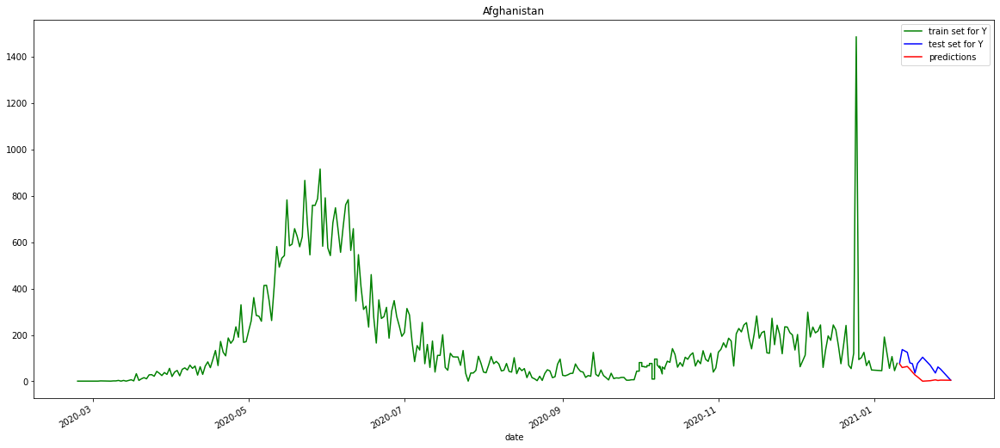

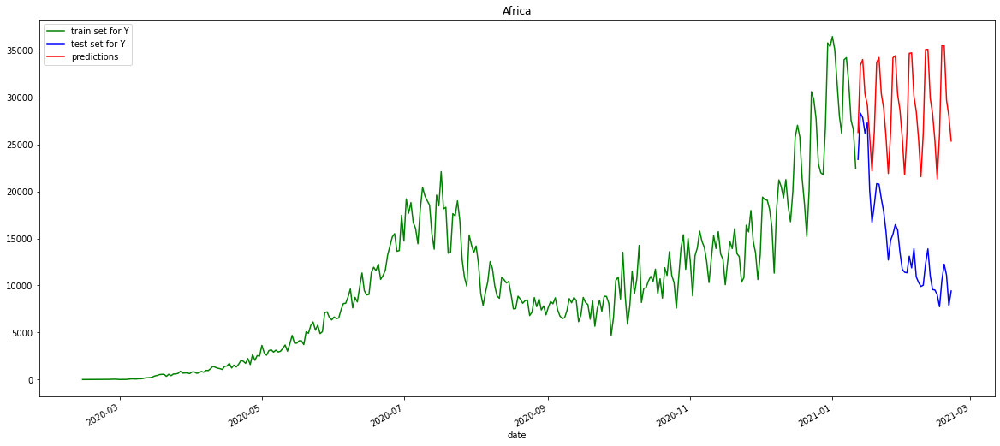

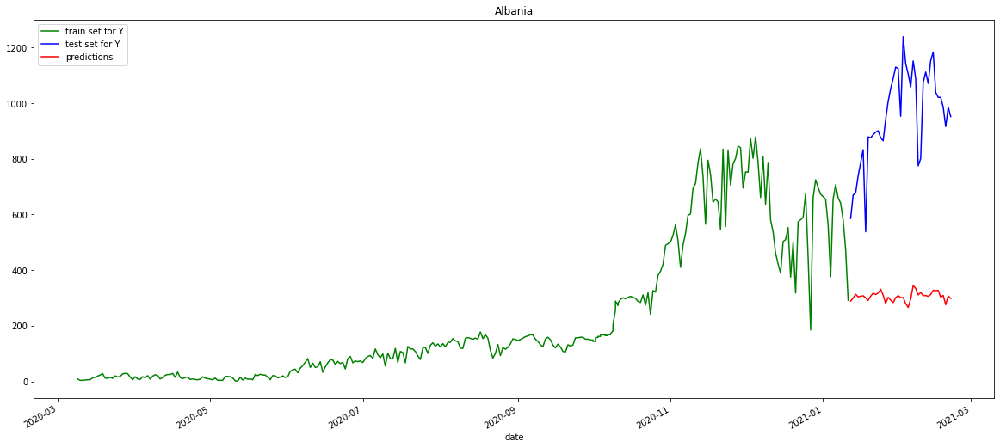

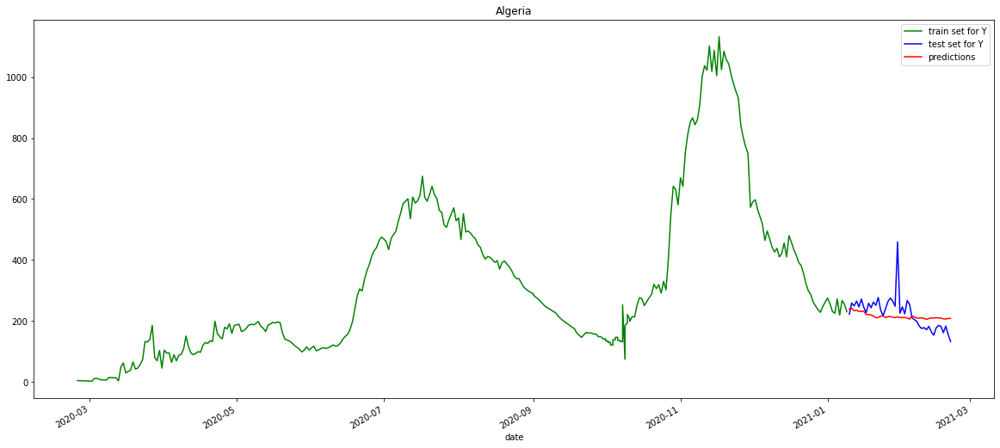

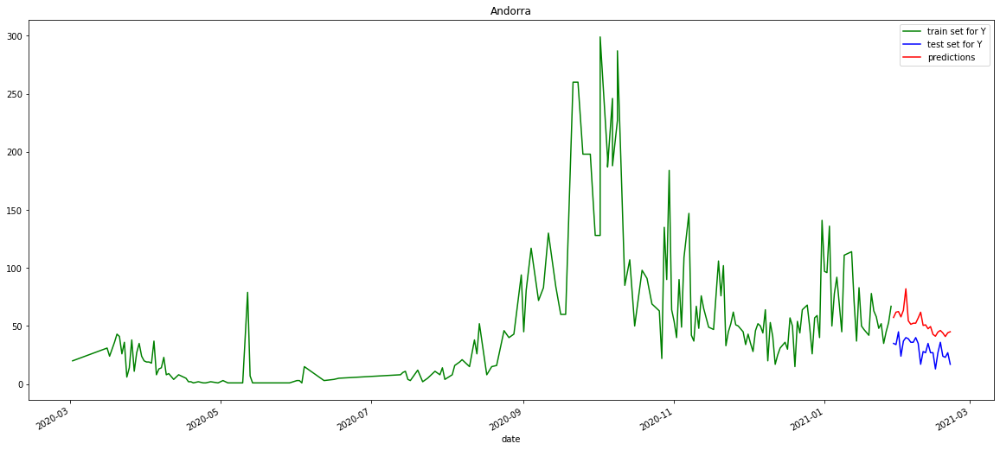

...

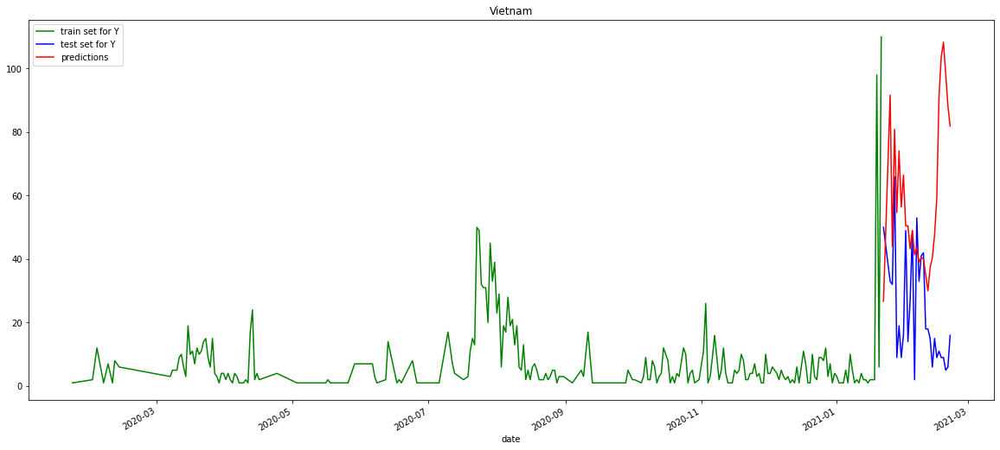

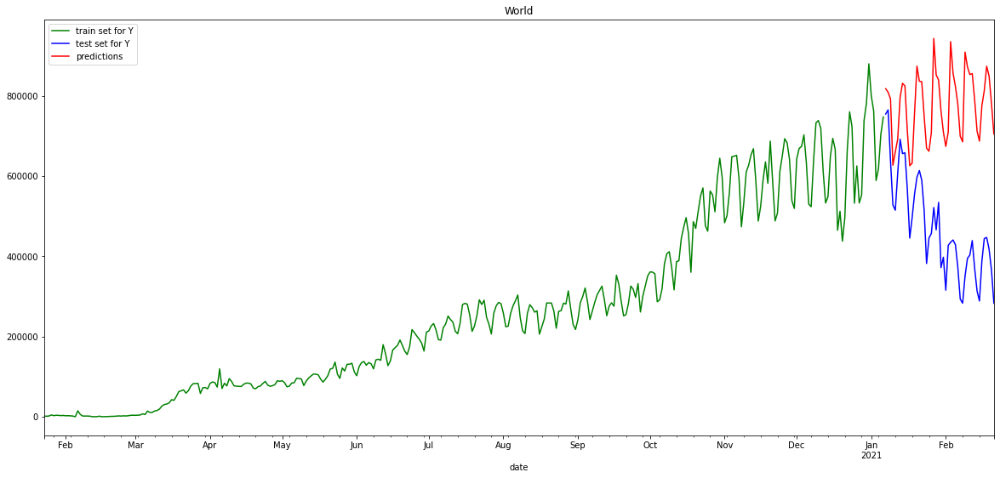

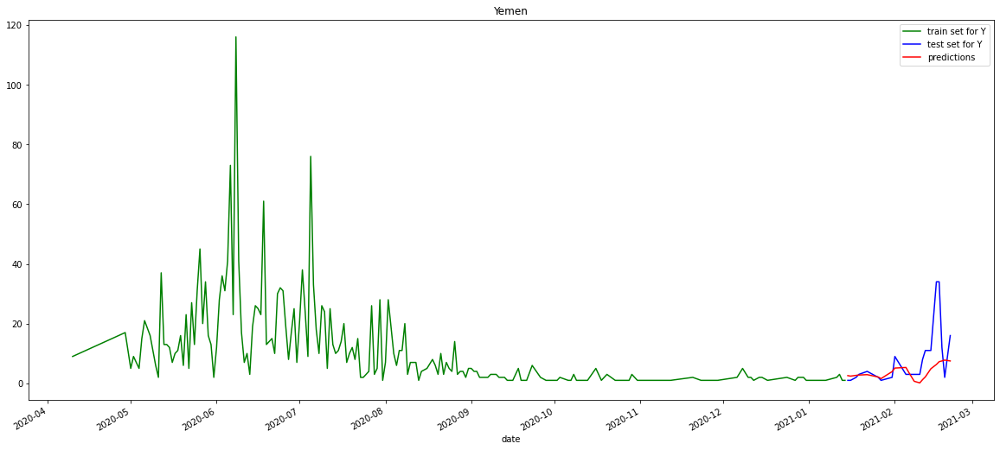

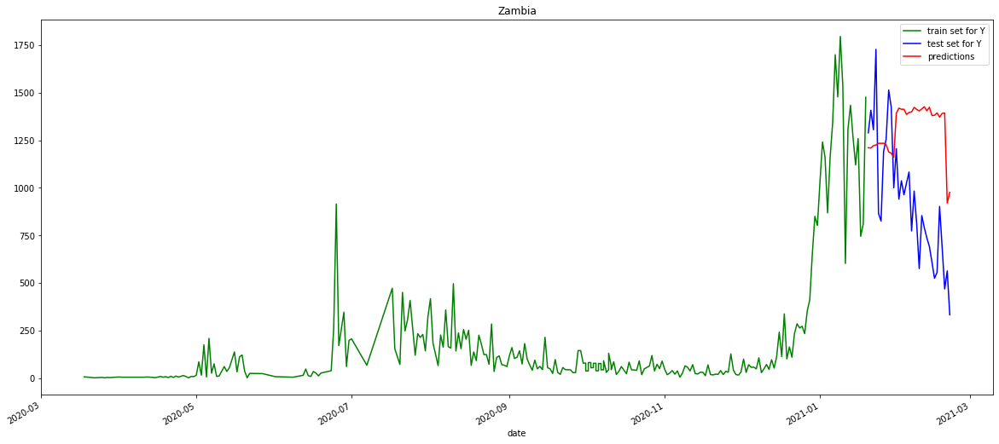

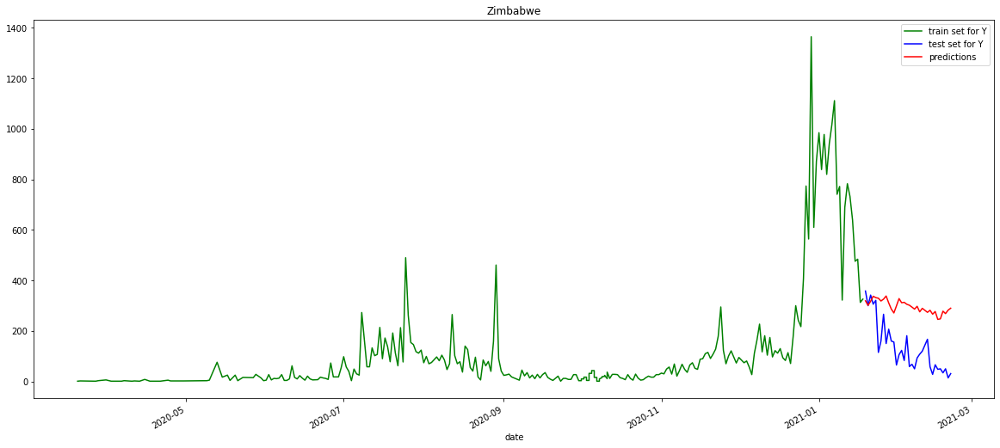

In [87]:
errors=[]
for i in countries:
  try:
    country=countries[i]

    country.index = pd.DatetimeIndex(country['date'], freq='infer')
    country= country.select_dtypes(include=np.number)
    country = country.drop(columns=to_drop)
    country = country.drop(columns=drop_constant)
    country = country.drop(columns=drop_vacc)
    country = country[(country[['new_cases']] > 0).all(axis=1)]

    steps=-7
    predidf= country.copy()
    predidf['actual']=predidf['new_cases'].shift(steps)
    predidf=predidf.dropna()
    predidf['actual'].isna().sum()

    targ=pd.DataFrame(predidf['actual'])
    exo=predidf.drop(columns='actual')
    exo=exo.drop(columns='new_cases')

    train_size=int(len(country) *0.87)
    test_size = int(len(country)) - train_size
    train_X, train_y = exo[:train_size].dropna(), targ[:train_size].dropna()
    test_X, test_y = exo[train_size:].dropna(), targ[train_size:].dropna()

    model=auto_arima(train_y, 
                    exogenous= train_X,
                    start_p=1, start_q=1, 
                    max_p=7, max_q=7, 
                    d=1, max_d=7,
                    trace=True, 
                    error_action='ignore', 
                    # seasonal=True, m=1,
                    suppress_warnings=True, 
                    stepwise=True)
    # print(model.summary())

    realmodel= SARIMAX(train_y, 
    exog=train_X,
    order=model.order,
    seasonal_order=model.seasonal_order,
    enforce_invertibility=False, enforce_stationarity=False)

    results= realmodel.fit()

    predictions= results.predict(start =train_size, end=train_size+test_size+(steps)-1,exog=test_X)
    act= pd.DataFrame(test_y)

    predictions=pd.DataFrame(predictions)
    predictions.reset_index(drop=True, inplace=True)
    predictions.index=test_X.index
    predictions['new_cases_next_week'] = act['actual']
    predictions.rename(columns={'predicted_mean':'predicted'}, inplace=True)

    predictions['predicted']=predictions[(predictions['predicted'] > -0.5).replace(predictions['predicted'].mean())]
    predictions=predictions.dropna()

    fig, ax = plt.subplots(figsize=(20,9))
    print(train_y.plot(color='green', ax=ax))
    print(predictions['new_cases_next_week'].plot(color='blue', ax=ax))
    print(predictions['predicted'].plot(color='red', ax=ax))
    print(plt.title(i))
    print(ax.legend(['train set for Y','test set for Y','predictions']))

    error=rmse(predictions['predicted'], predictions['new_cases_next_week'])
    errors.append(error)
  except:
    continue

In [88]:
print(errors)

[53.13771756784765, 15252.279074225153, 670.1715323533014, 52.655656971519875, 23.819088769934538, 22.8719242634738, 35.06622413567648, 2436.723201209044, 121.7924002514476, 11978.635064832657, 29.804615475351333, 480.4513704839793, 152.4081067011823, 15.880476610597428, 346.10756119871786, 692.608082991754, 66.09032233565203, 462.6697101629872, 1471.8202994108303, 56.04214407228459, 134.2601799333723, 1.548708786229126, 703.8797441852785, 286.13578389230423, 307.1453374864421, 18594.85313091974, 728.4993303800222, 66.07028164398484, 19.555851199608956, 29.435513253180762, 344.7176798164596, 5898.351432245688, 42.97540354323347, 129.10923206228543, 23.542676178678985, 7164.560278888941, 91.72285228339655, 10270.162939492122, 17.577253892969292, 127.83493343309077, 781.9529181844491, 117.27154472596841, 230.45892064593437, 476.07014411297405, 77.59227017275289, 5270.220197901695, 94.91574152614908, 478.05592331876755, 7.811573219292359, 321.7424893087943, 1082.564645409621, 152.77146477

In [89]:
import numpy as np

In [90]:
errors=[53.13771756784765, 15252.279074225153, 670.1715323533014, 52.655656971519875, 23.819088769934538, 22.8719242634738, 35.06622413567648, 2436.723201209044, 121.7924002514476, 11978.635064832657, 29.804615475351333, 480.4513704839793, 152.4081067011823, 15.880476610597428, 346.10756119871786, 692.608082991754, 66.09032233565203, 462.6697101629872, 1471.8202994108303, 56.04214407228459, 134.2601799333723, 1.548708786229126, 703.8797441852785, 286.13578389230423, 307.1453374864421, 18594.85313091974, 728.4993303800222, 66.07028164398484, 19.555851199608956, 29.435513253180762, 344.7176798164596, 5898.351432245688, 42.97540354323347, 129.10923206228543, 23.542676178678985, 7164.560278888941, 91.72285228339655, 10270.162939492122, 17.577253892969292, 127.83493343309077, 781.9529181844491, 117.27154472596841, 230.45892064593437, 476.07014411297405, 77.59227017275289, 5270.220197901695, 94.91574152614908, 478.05592331876755, 7.811573219292359, 321.7424893087943, 1082.564645409621, 152.77146477856516, 430.56448116471654, 37.13891691642583, 35.9856001160077, 269.2284601834597, 82.77404101676414, 321.0856000885077, 55849.561381377505, 47778.06269882405, 142.31099007083122, 22318.697599151863, 225.06802672334936, 31.892462957646273, 289.3166406581409, 8296.484379867532, 528.8245107573681, 788.7143312252667, 616.3620793242337, 53.77827296625908, 12.552987595081078, 27.754784810630102, 48.45523456067038, 574.10706127174, 1380.6720274786837, 16.609926119585744, 1994.6147978641031, 2581.8927054701307, 1150.0804617144684, 1709.8743932857008, 2129.202639935588, 2829.579191748081, 149.99365774131073, 5281.8891212215485, 1224.7268033314147, 968.3961320481951, 181.665379158474, 388.8786767276622, 448.47529660723274, 246.65019526283464, 185.25665281949694, 1205.421813700595, 77.68224761494757, 20.25008284222121, 483.4937932299453, 4.856697403287986, 303.66916586562866, 709.6826197370626, 514.332571744247, 925.1090775505147, 78.55221384663464, 50.35082508273972, 45.5697963932409, 7.927151810202727, 5.601289593914446, 39761.45150431034, 448.7003644326349, 21.08501816472999, 11.063955085125704, 95.64331109046255, 486.97399592382294, 253.66129607401288, 248.0053102309158, 76.76396492182732, 362.44789262994703, 1028.3655290128124, 4.64097247619663, 24.640803508912953, 587.3218555540174, 133481.55138149025, 248.9231894490613, 353.0524894236525, 23.720240127483645, 178.92244016328965, 723.6955231433903, 377.0446997446484, 1264.5172911754814, 49.61339823229007, 395.3944579507049, 9893.052596743264, 1190.120099194415, 5600.04594098497, 8701.598310012148, 167.8770832954665, 1529.699263184038, 8073.536306860523, 101.08399143872052, 90.04153461277403, 11.059380354339389, 21.36754206290567, 20.288076666710186, 198.26225657040345, 89.40543897694768, 1053.419193829543, 13.10150022465728, 34.91449651297733, 37.330807690435066, 1017.2292792908331, 371.28660788721857, 118.83076234299344, 4673.381568945139, 25146.722271112783, 174.57728802573115, 76.32660253166887, 62239.370980297, 171.58957251161362, 231.83588418239555, 42.740007907452075, 5895.786659118304, 2575.9070148695546, 25.020710347412304, 6.206719360911891, 22.480101556531537, 370.91699758095166, 43.84588865324406, 11.862435507354775, 2940.5123346445066, 2943.35377238841, 406.90887960292673, 1436.9542180025298, 517.9579951853301, 28358.24173987085, 153936.98491839215, 189.13674187190878, 24.985518192985015, 99.81941790238584, 48.57077383072522, 331206.0335602422, 9.294003315579818, 525.7223861833606, 183.74920597720399]

In [91]:
len(errors)

181

In [92]:
print('min error is: ', min(errors))
print('max error is: ', max(errors))
print('avg error is: ',np.mean(errors))

min error is:  1.548708786229126
max error is:  331206.0335602422
avg error is:  6065.920587947992


In [93]:
errors=pd.DataFrame(errors)

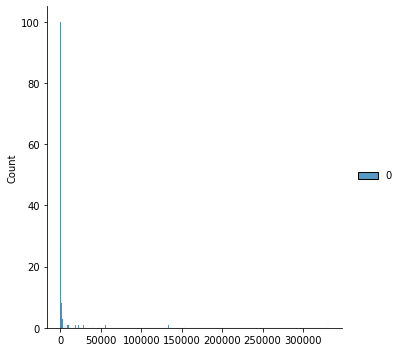

In [94]:
sns.displot(errors)
plt.show()

In [2]:
# #%%
# '''
# Expanding window cross validation
# Similar to sklearn format
# @ germayne  
# '''
# import numpy as np

# class expanding_window(object):
#     '''	
#     Parameters 
#     ----------
    
#     Note that if you define a horizon that is too far, then subsequently the split will ignore horizon length 
#     such that there is validation data left. This similar to Prof Rob hyndman's TsCv 
    
    
#     initial: int
#         initial train length 
#     horizon: int 
#         forecast horizon (forecast length). Default = 1
#     period: int 
#         length of train data to add each iteration 
#     '''
    

#     def __init__(self,initial= 1,horizon = 1,period = 1):
#         self.initial = initial
#         self.horizon = horizon 
#         self.period = period 


#     def split(self,data):
#         '''
#         Parameters 
#         ----------
        
#         Data: Training data 
        
#         Returns 
#         -------
#         train_index ,test_index: 
#             index for train and valid set similar to sklearn model selection
#         '''
#         self.data = data
#         self.counter = 0 # for us to iterate and track later 


#         data_length = data.shape[0] # rows 
#         data_index = list(np.arange(data_length))
         
#         output_train = []
#         output_test = []
#         # append initial 
#         output_train.append(list(np.arange(self.initial)))
#         progress = [x for x in data_index if x not in list(np.arange(self.initial)) ] # indexes left to append to train 
#         output_test.append([x for x in data_index if x not in output_train[self.counter]][:self.horizon] )
#         # clip initial indexes from progress since that is what we are left 
         
#         while len(progress) != 0:
#             temp = progress[:self.period]
#             to_add = output_train[self.counter] + temp
#             # update the train index 
#             output_train.append(to_add)
#             # increment counter 
#             self.counter +=1 
#             # then we update the test index 
            
#             to_add_test = [x for x in data_index if x not in output_train[self.counter] ][:self.horizon]
#             output_test.append(to_add_test)

#             # update progress 
#             progress = [x for x in data_index if x not in output_train[self.counter]]	
            
#         # clip the last element of output_train and output_test
#         output_train = output_train[:-1]
#         output_test = output_test[:-1]
        
#         # mimic sklearn output 
#         index_output = [(train,test) for train,test in zip(output_train,output_test)]
        
#         return index_output
        
        
# #%%
# #%%
# # demo 

# X = np.array([[1, 2], [3, 4], [1, 2], [3, 4], [1, 2], [3, 4]])

# y = np.array([1, 2, 3, 4, 5, 6])
# tscv = expanding_window()
# for train_index, test_index in tscv.split(X):
#     print(train_index)
#     print(test_index)



# X = np.random.randint(0,1000,size = (120,2))
# y = np.random.randint(0,1000,size = (120,1))

# tscv = expanding_window(initial = 36, horizon = 24,period = 1)
# for train_index, test_index in tscv.split(X):
#     print(train_index)
#     print(test_index)
# #%%

In [1]:
# prediction = []
# data = train.values
# for t in test.values:
#    model = (ExponentialSmoothing(data).fit())
#    y = model.predict()
#    prediction.append(y[0])
#    data = numpy.append(data, t)

# test_ = pandas.DataFrame(test)
# test_['predictionswf'] = prediction

# plt.plot(test_['T'])
# plt.plot(test_.predictionswf, '--')
# plt.show()

# error = sqrt(metrics.mean_squared_error(test.values,prediction))
# print ('Test RMSE for Triple Exponential Smoothing with Walk-Forward Validation: ', error)

# Time Series / NEURAL NETWORK
Here I was just experimenting with recurrent Neural Networks and in particular LSTM (long short term memory). I do believe something wrong is happening since predictions are too good to be true. The model must have contaminated test X with the target - this used to happen on ARIMAX as well until I solved it. 

In [ ]:
targ=pd.DataFrame(predidf['actual'])

In [ ]:
targ=targ.dropna()

In [ ]:
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return numpy.array(dataX), numpy.array(dataY)

# fix random seed for reproducibility
numpy.random.seed(7)
# load the dataset
# dataframe = read_csv('airline-passengers.csv', usecols=[1], engine='python')
# dataset = dataframe.values
# dataset = dataset.astype('float32')

# normalize the dataset (**scaling after the train-test split**)
dataset=targ
# scaler = MinMaxScaler(feature_range=(0, 1))
# dataset = scaler.fit_transform(targ)

# split into train and test sets
train_size = int(len(dataset) * 0.67)
test_size = len(dataset) - train_size
# train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
train, test = dataset[0:train_size], dataset[train_size:len(dataset)]

scaler = MinMaxScaler(feature_range=(0, 1))
train = scaler.fit_transform(train)
test = scaler.fit_transform(test)

# reshape into X=t and Y=t+1
look_back = 1
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict

# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict

# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

In [ ]:
targ.tail(10)

In [ ]:
itanum=italy.select_dtypes(np.number)

In [ ]:
itanum

In [ ]:
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return numpy.array(dataX), numpy.array(dataY)
# fix random seed for reproducibility
numpy.random.seed(7)
# load the dataset
# dataframe = read_csv('airline-passengers.csv', usecols=[1], engine='python')
# dataset = dataframe.values
# dataset = dataset.astype('float32')
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(itanum)
# split into train and test sets
train_size = int(len(dataset) * 0.67)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 1
trainX, trainY = create_dataset(train, train.y, look_back)
testX, testY = create_dataset(test, test.y, look_back)
# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)
# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

In [ ]:
Brazil=countries['Brazil']

In [ ]:
import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return numpy.array(dataX), numpy.array(dataY)
# fix random seed for reproducibility
numpy.random.seed(7)
# load the dataset
# dataframe = read_csv('airline-passengers.csv', usecols=[1], engine='python')
# dataset = dataframe.values
# dataset = dataset.astype('float32')
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(Brazil)
# split into train and test sets
train_size = int(len(dataset) * 0.67)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 1
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)
# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

In [ ]:
Brazil.index = pd.DatetimeIndex(Brazil['date'], freq=None)

In [ ]:
Brazil=Brazil['new_cases']

In [ ]:
Brazil=pd.DataFrame(Brazil)